In [ ]:
from notebooks import *
print_sys_info()

/opt/conda/lib/python3.6/importlib/_bootstrap.py:219: RuntimeWarning: numpy.dtype size changed, may indicate binary incompatibility. Expected 96, got 88
  return f(*args, **kwds)


/opt/conda/lib/python3.6/importlib/_bootstrap.py:219: RuntimeWarning: numpy.dtype size changed, may indicate binary incompatibility. Expected 96, got 88
  return f(*args, **kwds)


/opt/conda/lib/python3.6/importlib/_bootstrap.py:219: RuntimeWarning: numpy.dtype size changed, may indicate binary incompatibility. Expected 96, got 88
  return f(*args, **kwds)


/opt/conda/lib/python3.6/importlib/_bootstrap.py:219: RuntimeWarning: numpy.dtype size changed, may indicate binary incompatibility. Expected 96, got 88
  return f(*args, **kwds)


/opt/conda/lib/python3.6/importlib/_bootstrap.py:219: RuntimeWarning: numpy.dtype size changed, may indicate binary incompatibility. Expected 96, got 88
  return f(*args, **kwds)


/opt/conda/lib/python3.6/importlib/_bootstrap.py:219: RuntimeWarning: numpy.dtype size changed, may indicate binary incompatibility. Expected 96, got 88
  return f(*args, **kwds)


/opt/conda/lib/python3.6/importlib/_bootstrap.py:219: RuntimeWarning: numpy.dtype size changed, may indicate binary incompatibility. Expected 96, got 88
  return f(*args, **kwds)


/opt/conda/lib/python3.6/importlib/_bootstrap.py:219: RuntimeWarning: numpy.dtype size changed, may indicate binary incompatibility. Expected 96, got 88
  return f(*args, **kwds)


/opt/conda/lib/python3.6/importlib/_bootstrap.py:219: RuntimeWarning: numpy.dtype size changed, may indicate binary incompatibility. Expected 96, got 88
  return f(*args, **kwds)


/opt/conda/lib/python3.6/site-packages/sklearn/ensemble/weight_boosting.py:29: DeprecationWarning: numpy.core.umath_tests is an internal NumPy module and should not be imported. It will be removed in a future NumPy release.
  from numpy.core.umath_tests import inner1d


platform:
  machine: x86_64
  node: 1b3c8f86dc93
  processor: x86_64
  release: 4.14.41+
  system: Linux
  version: '#1 SMP Wed Aug 15 22:11:25 PDT 2018'
cpu: 96
mem: 85g
swap: 0g


In [ ]:
# Load models
load = Load()
projection = Projection.load('peterson-v0-26bae1c', features=Features(load=load))

[20:47:58.583] DEBUG  Projection.load
  path: /app/data/models/projection/peterson-v0-26bae1c.pkl


In [ ]:
# Experiment ID
experiment_id_prefix = 'comp-l1-l2'

In [ ]:
# Select recs
#   1. countries: Filter recs to these countries
#   2. species: Filter recs to these species
#   3. recs_at_least: Filter species to those with at least this many recs
#   4. num_species: Sample this many of the species
#   5. num_recs: Sample this many recs per species
inf = np.inf
# countries_k, com_names_k = 'na', 'us'      # 9.4k/400k -> 1.1k/60k -> 774/53k
countries_k, com_names_k = 'na', 'ca'      # 9.4k/400k -> 1.1k/60k -> 334/35k
# countries_k, com_names_k = 'na', 'dan170'  # 9.4k/400k -> 1.1k/60k -> 170/3.4k
# countries_k, com_names_k = 'na', 'dan4'    # 9.4k/400k -> 1.1k/60k ->   4/2.2k
recs_at_least, num_species, num_recs =   0, inf, inf  # US[334/35k ->1.1k/60k -> 774/53k -> 774/53k   -> 743/53k]    # All US
# recs_at_least, num_species, num_recs = 100, 100, 100  # CA[334/35k -> 127/25k -> 100/21k -> 100/10k   -> 100/10k]
# recs_at_least, num_species, num_recs =  50, 100, 100  # CA[334/35k -> 224/32k -> 100/16k -> 100/ 9.0k -> 100/ 9.0k]
# recs_at_least, num_species, num_recs =   0, 100, 100  # CA[334/35k -> 334/35k -> 100/12k -> 100/ 6.8k ->  99/ 6.8k]
# recs_at_least, num_species, num_recs =   0, 168, 100  # CA[334/34k -> 334/34k -> 168/18k -> 168/11k   -> 167/11k]    # (old 'all')
# recs_at_least, num_species, num_recs =   0, 168,  20  # CA[334/34k -> 334/35k -> 168/18k -> 168/ 3.2k -> 167/ 3.2k]  # (old 'recs')
# recs_at_least, num_species, num_recs =  20, 168,  20  # CA[334/35k -> 296/35k -> 168/20k -> 168/ 3.4k -> 168/ 3.4k]  # Familiar set
# recs_at_least, num_species, num_recs =  20, 336,  20  # US[774/53k -> 528/51k -> 336/33k -> 336/ 6.7k -> 336/ 6.7k]  # Scale species
# recs_at_least, num_species, num_recs =  10, 168,  20  # CA[334/35k ->                                             ]  # Class imbalance
# recs_at_least, num_species, num_recs =   0, 168,  20  # CA[334/35k ->                                             ]  # Class imbalance
# recs_at_least, num_species, num_recs =   0, inf,  20  # dan170 for app_brainstorm_1
# recs_at_least, num_species, num_recs =  20, 50,  100  # Faster dev
# recs_at_least, num_species, num_recs =  20, 50,   50  # Faster dev
# recs_at_least, num_species, num_recs =  20, 50,   20  # Faster dev
# recs_at_least, num_species, num_recs =  20, 50,   10  # Faster dev
# recs_at_least, num_species, num_recs =  20, 50,    5  # Faster dev
get_recs_stats = lambda df: dict(sp=df.species.nunique(), recs=len(df))
puts_stats = lambda desc: partial(tap, f=lambda df: print('%-15s %12s (sp/recs)' % (desc, '%(sp)s/%(recs)s' % get_recs_stats(df))))
xcs = (xc.metadata
    .pipe(puts_stats('all'))
    # 1. countries: Filter recs to these countries
    [lambda df: df.country.isin(constants.countries[countries_k])]
    .pipe(puts_stats('countries'))
    # 2. species: Filter recs to these species
    [lambda df: df.species.isin(com_names_to_species(*com_names[com_names_k]))]
    .pipe(puts_stats('species'))
    # Omit not-downloaded recs (should be few within the selected countries)
    [lambda df: df.downloaded]
    .pipe(puts_stats('(downloaded)'))
    # Remove empty cats for perf
    .pipe(df_remove_unused_categories)
    # 3. recs_at_least: Filter species to those with at least this many recs
    [lambda df: df.species.isin(df.species.value_counts()[lambda s: s >= recs_at_least].index)]
    .pipe(puts_stats('recs_at_least'))
    # 4. num_species: Sample this many of the species
    [lambda df: df.species.isin(df.species.drop_duplicates().pipe(lambda s: s.sample(n=min(len(s), num_species), random_state=0)))]
    .pipe(puts_stats('num_species'))
    # 5. num_recs: Sample this many recs per species
    #   - Remove empty cats else .groupby fails on empty groups
    .pipe(df_remove_unused_categories)
    .groupby('species').apply(lambda g: g.sample(n=min(len(g), num_recs), random_state=0))
    .pipe(puts_stats('num_recs'))
    # Drop species with <2 recs, else StratifiedShuffleSplit complains (e.g. 'TUVU')
    [lambda df: df.species.isin(df.species.value_counts()[lambda s: s >= 2].index)]
    .pipe(puts_stats('recs ≥ 2'))
    # Clean up for downstream
    .pipe(df_remove_unused_categories)
)
_recs_stats = get_recs_stats(xcs)
recs_stats = ', '.join(['%s[%s]' % (k, v) for k, v in _recs_stats.items()])
display(
    recs_stats,
    df_summary(xcs).T,
    xcs.sample(n=10, random_state=0).sort_values('species'),
)

all              9442/399859 (sp/recs)
countries         1148/59713 (sp/recs)
species            334/35237 (sp/recs)
(downloaded)       334/35229 (sp/recs)
recs_at_least      334/35229 (sp/recs)
num_species        334/35229 (sp/recs)


num_recs           334/35229 (sp/recs)
recs ≥ 2           331/35226 (sp/recs)


'sp[331], recs[35226]'

,,,,,,,,min,25%,50%,75%,max
,dtype,sizeof,len,count,nunique,mean,std,,,,,
downloaded,bool,35226,35226,35226,1,NaN,NaN,True,True,True,True,True
species,category,100885,35226,35226,331,NaN,NaN,SNGO,LEFL,CAGN,FOSP,PTWH
id,int64,281808,35226,35226,35226,219189.394,110898.575,584,135962,207428,320709,417729
sci_name,category,105633,35226,35226,332,NaN,NaN,Chen caerulescens,Empidonax minimus,Polioptila californica,Passerella iliaca,Vidua macroura
com_name,category,104954,35226,35226,332,NaN,NaN,Snow Goose,Least Flycatcher,California Gnatcatcher,Fox Sparrow,Pin-tailed Whydah
subspecies,object,2076250,35226,35226,715,NaN,NaN,,,,,zelotes
recordist,object,2509136,35226,35226,751,NaN,NaN,AJ Knue,Frank Lambert,Matt Wistrand,Richard E Webster,Étienne Leroy
country,object,2405368,35226,35226,3,NaN,NaN,Canada,United States,United States,United States,United States
locality,object,3600735,35226,35226,6444,NaN,NaN,"Bangor City Forest, Penobscot County, Maine","Durfee Hill, Glocester, Providence County, Rhode Island","Merritt Square Mall, Merritt Island, Brevard County, Florida","Round Valley, Chiricahua Mountains, Cochise Co., Arizona","Álvaro Obregón (near Ciudad de México), Ciudad de México"


,,downloaded,species,id,sci_name,com_name,subspecies,recordist,country,locality,lat,lng,type,quality,date,time,license_type,license_detail,license,url,download
species,,,,,,,,,,,,,,,,,,,,,
SPOW,33738,True,SPOW,383310,Strix occidentalis,Spotted Owl,occidentalis,Lance A. M. Benner,United States,"Red Box to Valley Forge Campground, Angeles National Forest, Los Angeles County, California",34.3,-118.0,"call, female",no score,2017-08-05 00:00:00,20:33,by-nc-sa,4.0,//creativecommons.org/licenses/by-nc-sa/4.0/,https://www.xeno-canto.org/383310,//www.xeno-canto.org/383310/download
WBNU,334163,True,WBNU,72056,Sitta carolinensis,White-breasted Nuthatch,alexandrae,Richard E Webster,Mexico,"La Corona Arriba, Sierra San Pedro Martir, Baja California",31.0,-116.0,call,C,2010-09-25 00:00:00,0824,by-nc-nd,2.5,//creativecommons.org/licenses/by-nc-nd/2.5/,https://www.xeno-canto.org/72056,//www.xeno-canto.org/72056/download
WOTH,369818,True,WOTH,33467,Hylocichla mustelina,Wood Thrush,,Andrew Spencer,United States,"Steel Creek, Buffalo National River, Madison Co., Arkansas",36.0,-93.3,song,A,2009-04-26 00:00:00,07:35,by-nc-nd,2.5,//creativecommons.org/licenses/by-nc-nd/2.5/,https://www.xeno-canto.org/33467,//www.xeno-canto.org/33467/download
CATH,288038,True,CATH,121010,Toxostoma redivivum,California Thrasher,,Lance A. M. Benner,United States,"Powder Canyon, Puente Hills, Los Angeles County, California",34.0,-118.0,song,B,2013-02-02 00:00:00,11:49,by-nc-sa,3.0,//creativecommons.org/licenses/by-nc-sa/3.0/,https://www.xeno-canto.org/121010,//www.xeno-canto.org/121010/download
GRWA,92364,True,GRWA,323600,Setophaga graciae,Grace's Warbler,graciae,Richard E. Webster,United States,"Rucker Canyon, Chiricahua Mountains",31.8,-109.0,song,B,2015-05-30 00:00:00,19:00,by-nc-sa,4.0,//creativecommons.org/licenses/by-nc-sa/4.0/,https://www.xeno-canto.org/323600,//www.xeno-canto.org/323600/download
BCSP,283513,True,BCSP,125726,Spizella atrogularis,Black-chinned Sparrow,cana,Richard E. Webster,United States,"Arrastre Creek at 2N02, San Bernardino Mountains, California",34.3,-117.0,song,A,2006-05-05 00:00:00,09:00,by-nc-sa,3.0,//creativecommons.org/licenses/by-nc-sa/3.0/,https://www.xeno-canto.org/125726,//www.xeno-canto.org/125726/download
BTSP,297229,True,BTSP,111342,Amphispiza bilineata,Black-throated Sparrow,deserticola,Richard E Webster,United States,"Silver Creek, Cave Creek Canyon, Cochise County, Arizona",31.9,-109.0,subsong,A,2010-09-09 00:00:00,07:37,by-nc-nd,2.5,//creativecommons.org/licenses/by-nc-nd/2.5/,https://www.xeno-canto.org/111342,//www.xeno-canto.org/111342/download
GTTO,296563,True,GTTO,112024,Pipilo chlorurus,Green-tailed Towhee,,Richard E Webster,United States,"Round Valley, Chiricahua Mountains, Cochise Co., Arizona",32.0,-109.0,"call, song",A,2008-09-29 00:00:00,08:35,by-nc-nd,2.5,//creativecommons.org/licenses/by-nc-nd/2.5/,https://www.xeno-canto.org/112024,//www.xeno-canto.org/112024/download
BHGR,135981,True,BHGR,278681,Pheucticus melanocephalus,Black-headed Grosbeak,,Nick Komar,United States,"Patagonia Roadside Rest Area, Patagonia, AZ",31.5,-111.0,"begging call, juvenile",C,2015-09-08 00:00:00,09:15,by-nc-sa,4.0,//creativecommons.org/licenses/by-nc-sa/4.0/,https://www.xeno-canto.org/278681,//www.xeno-canto.org/278681/download


In [ ]:
xcs_paths = [
    ('xc', f'{data_dir}/xc/data/{row.species}/{row.id}/audio.mp3')
    for row in df_rows(xcs)
]
joblib.dump(xcs_paths, '/tmp/xcs_paths')  # In case you want to run load.recs in a terminal (it's long and verbose)
display(
    f"{len(xcs_paths)}/{len(xcs)}",
    # xcs_paths[:2],
)

'35226/35226'

In [ ]:
# TODO Restore once:true after debug [but think carefully how once:true interacts with the once:false params above]
recs = load.recs(paths=xcs_paths)
display(
    df_summary(recs).T,
    recs[:5],
)

,,,,,,,,min,25%,50%,75%,max
,dtype,sizeof,len,count,nunique,mean,std,,,,,
index,int64,281648,35206,35206,35206,1.760e+04,1.016e+04,0,8801,17602,26403,35205
dataset,object,2077154,35206,35206,1,NaN,NaN,xc,xc,xc,xc,xc
species,category,100845,35206,35206,331,NaN,NaN,SNGO,LEFL,CAGN,FOSP,PTWH
species_com_name,category,104789,35206,35206,331,NaN,NaN,Snow Goose,Least Flycatcher,California Gnatcatcher,Fox Sparrow,Pin-tailed Whydah
species_query,object,2147576,35206,35206,331,NaN,NaN,ABTO,CONI,LEGO,SACR,yecpar
duration_s,float64,281648,35206,35206,21247,5.711e+01,7.221e+01,0.209,16.6,35,69.1,2.75e+03
samples_mb,float64,281648,35206,35206,21236,2.417e+00,3.070e+00,0.00879,0.7,1.47,2.92,115
samples_n,int64,281648,35206,35206,21236,1.267e+06,1.610e+06,4608,367030,772992,1533092,60534352
basename,object,2182772,35206,35206,1,NaN,NaN,audio,audio,audio,audio,audio


,dataset,species,species_com_name,species_query,duration_s,samples_mb,samples_n,basename,species_longhand,id,path
0,xc,SNGO,Snow Goose,SNGO,28.3,1.19,624456,audio,Snow Goose - SNGO,xc/data/SNGO/143620/audio,xc/data/SNGO/143620/audio.mp3
1,xc,SNGO,Snow Goose,SNGO,149.0,6.28,3293022,audio,Snow Goose - SNGO,xc/data/SNGO/298775/audio,xc/data/SNGO/298775/audio.mp3
2,xc,SNGO,Snow Goose,SNGO,21.6,0.91,476928,audio,Snow Goose - SNGO,xc/data/SNGO/116051/audio,xc/data/SNGO/116051/audio.mp3
3,xc,SNGO,Snow Goose,SNGO,44.6,1.88,983275,audio,Snow Goose - SNGO,xc/data/SNGO/392249/audio,xc/data/SNGO/392249/audio.mp3
4,xc,SNGO,Snow Goose,SNGO,148.0,6.23,3267214,audio,Snow Goose - SNGO,xc/data/SNGO/357958/audio,xc/data/SNGO/357958/audio.mp3


In [ ]:
# Fast-and-cheap version (<1s) of the plots below (~7s)
(recs
    .species_longhand.value_counts().sort_index()
    .reset_index().rename(columns={'index': 'species_longhand', 'species_longhand': 'num_recs'})
    .assign(num_recs=lambda df: df.num_recs.map(lambda n: '%s /%s' % ('•' * int(n / df.num_recs.max() * 60), df.num_recs.max())))
)

,species_longhand,num_recs
0,Snow Goose - SNGO,••••• /659
1,Greater White-fronted Goose - GWFG,••• /659
2,Brant - BRAN,•• /659
3,Cackling Goose - CACG,••• /659
4,Canada Goose - CANG,•••••••••• /659
5,Tundra Swan - TUSW,•• /659
6,Egyptian Goose - EGGO,/659
7,Cinnamon Teal - CITE,/659
8,Gadwall - GADW,•• /659
9,American Wigeon - AMWI,••• /659


In [ ]:
# Num recs loaded for training + total num available [slow: ~7s]
(recs
    .pipe(df_reverse_cat, 'species_longhand')
    .assign(recs_n=1).groupby(['species', 'species_longhand'])['recs_n'].sum().reset_index()
    .set_index('species')
    # [:100]
    .join(how='left', other=(xc.metadata
        .assign(total_n=1).groupby('species')['total_n'].sum().reset_index()
        .set_index('species')
    ))
    .reset_index()
    .pipe(ggplot)
    + aes(x='species_longhand')
    + geom_col(aes(y='total_n'), fill='darkgray')
    + geom_col(aes(y='recs_n'), fill=scale_color_cmap(mpl.cm.tab10).palette(0))
    # + geom_point(aes(y='total_n'), color='darkgray')
    # + geom_point(aes(y='recs_n'), color=scale_color_cmap(mpl.cm.tab10).palette(0))
    + expand_limits(y=0)
    + coord_flip()
    + theme(axis_text_y=element_text(size=4))
    + theme_figsize(width=18, aspect_ratio=3/2)
    + ggtitle('Num recs loaded for training + total num available')
)

[skip]

In [ ]:
# Plot recs with duration [slow: ~7s]
(recs
    .assign(species=lambda df: df.species_longhand)
    .assign(count=1)
    # 0-fill all (species, dataset) combinations to create empty placeholders for missing bars
    .pipe(lambda df: df.append(
        pd.DataFrame([
            dict(species=species, dataset=dataset, duration_s=0)
            for species in df.species.unique()
            for dataset in df.dataset.unique()
        ])
        .astype({'species': df.species.dtype})
    ))
    .groupby(['dataset', 'species'])[['count', 'duration_s']].sum().reset_index()
    # Order by species by taxo
    .pipe(df_reverse_cat, 'species')
    # Order by species by count
    # .pipe(df_ordered_cat, species=lambda df: df.sort_values('count').species)
    .pipe(pd.melt, id_vars=['dataset', 'species'], value_vars=['count', 'duration_s'])
    .pipe(df_remove_unused_categories)
    .pipe(ggplot, aes(x='species', y='value', fill='dataset', color='dataset'))
    + coord_flip()
    + geom_bar(stat='identity', position=position_dodge(), width=.8)
    + facet_wrap('variable', nrow=1, scales='free')
    + xlab('')
    + ylab('')
    + scale_fill_cmap_d(mpl_cmap_concat('tab20', 'tab20b', 'tab20c'))
    + scale_color_cmap_d(mpl_cmap_concat('tab20', 'tab20b', 'tab20c'))
    + theme(panel_spacing=2.5)
    + theme_figsize(width=18, aspect_ratio=4/1)
    + ggtitle(f'recs: Total (count, duration_s) per (species, dataset)')
)

[skip]

In [ ]:
# Add .feat
recs = projection.transform(recs)

In [ ]:
# GridSearchCV many models / model params
#   - Order these roughly from most to least expensive, so that training runs fail fast (e.g. oom at the start, not the end)
param_grid = list(unique_everseen(tqdm([
    dict(
        classifier=[classifier],
        n_species=[n_species if isinstance(n_species, int) else int(n_species * _recs_stats['sp'])],
        n_recs=[
            # n_recs if isinstance(n_recs, int) else int(n_recs * _recs_stats['recs']),
            # TODO Figure out how to represent this as an n instead of a frac again [TODO interaction with test_size=.2 ...]
            #   - TODO Also make clear in the plot descs when e.g. (recs[3360], n_species[33], n_recs[1.0]) -> n_recs[33*20 < 3360]
            n_recs,
        ],
    )
    for (n_species, n_recs) in [
        # Subset for learning curves
        #   - Biggest first, to fail fast

        # Faster dev
        # (0.10, 0.10),

        # ca: n_species[9] for quick model comps
        # (0.03, 0.03),  # ~1000 recs in the train split
        # (0.03, 0.25),
        # (0.03, 0.50),
        (0.03, 1.00),

        # Scale data for n_species[86]
        # (0.25, 0.25),
        # (0.25, 0.50),
        (0.25, 1.00),

        # # Scale data for n_species[165]
        # (0.50, 0.25),
        # (0.50, 0.50),
        # (0.50, 1.00),

        # # Scale data for n_species[331]
        # (1.00, 0.25),
        # (1.00, 0.50),
        (1.00, 1.00),

        # # Scale species for n_recs[1]
        # (0.25, 1.00),
        # (0.50, 1.00),
        # (1.00, 1.00),

        # (None, None),

    ]
    for logreg_cls, logreg_solver in [
        ('logreg_ovr', 'liblinear'),  # 1 core
        ('logreg_ovr_l1', 'liblinear'),  # 1 core
        ('ovr-logreg_ovr', 'liblinear'),  # Multicore [but careful with mem: >1gb per 100% cpu -- tune in model.py]
        ('ovr-logreg_ovr_l1', 'liblinear'),  # Multicore [but careful with mem: >1gb per 100% cpu -- tune in model.py]
    ]
    for logreg_max_iter in (
        [None] if logreg_solver in ['liblinear'] else [
            # 800,
            3200,
            # 6400, 12800,
        ]
    )
    for logreg_C in [
        # 1/reg_strength: C=inf is no regularization, smaller C is more regularization (default: 1)
        # .0005, .005, .05, .5, 5, 50,
        # .0001, .001, .01, .1, 1, 10, 100,
        # 1,
        .003, .0003,
        .0001, .00001, .000001, .0000001,
        .03, .3,
        # .01, .1, 1,
        # .01, 1, 100,
        # .005, .05, .5,
        .001, .01, .1, 1, 10, 100, 1000,
        # .0001, .001, .01, .1, 1,
    ]
    for logreg_tol in one([tols for solvers, tols in [
        # Default: 1e-4
        # (['liblinear'], ['.0000000000000001']),  # liblinear keeps going, but only at large C -> unstable coefs
        # (['sag'], [
        #     # '.01',  # Faster than .001 (~5x) and even more suboptimal. Slower than liblinear, which has ~optimal acc.
        #     # '.001',  # Faster than .0001 (~5x) and a little suboptimal. Maybe useful for quick prototyping.
        #     None,  # Default: .0001, optimal-ish acc
        # ]),
    ] if logreg_solver in solvers] or [[None]])
    for logreg_class_weight in [
        # None,  # TODO Disabled to reduce noise. Re-enable to ponder the benefits of balance (slight but looks positive)
        'balanced',  # No (visually) significant effect with class sizes 0-20 (see class_imbalance notebooks)
    ]
    for sgdlog_cls in [
        # 'sgdlog',  # Acc is less good and more noisy than with std
        'std-sgdlog',
        'std-sgdlog_l1',
    ]
    for sgdlog_alpha in [
        # Multiplier for regularization, and influences learning_rate='optimal' (the default)
        # Default: .0001
        .0001, .001, .01,
        # '.00001', .0001, .001, .01, .1, 1, 10,
        # '.0000001', '.000001', '.00001', .0001, .001, .01, .1, 1, 10, 100, 1000,
    ]
    for sgdlog_tol in [
        None,  # Default: .001
        # .0001, '.00001',  # TODO No observed improvement (at small scale)
    ]
    for sgdlog_average in [
        None,
        # 'true',  # TODO No observed improvement (at small scale)
    ]
    for sgdlog_class_weight in [logreg_class_weight]
    for classifier in [

        # Logistic regression
        ','.join(x for x in [
            f'cls: {logreg_cls}',
            f'solver: {logreg_solver}',
            '' if logreg_max_iter is None else f'max_iter: {logreg_max_iter}',
            '' if logreg_tol is None else f'tol: {logreg_tol}',
            f'C: {logreg_C}',
            '' if logreg_class_weight is None else f'class_weight: {logreg_class_weight}',
        ] if x),

        # # Logistic regression via SGD(loss=log)
        # ','.join(x for x in [
        #     f'cls: {sgdlog_cls}',
        #     f'alpha: {sgdlog_alpha}',
        #     '' if not sgdlog_tol else f'tol: {sgdlog_tol}',
        #     '' if not sgdlog_average else f'average: {sgdlog_average}',
        #     '' if sgdlog_class_weight is None else f'class_weight: {sgdlog_class_weight}',
        # ] if x),

    ]
])))

# TODO Increase cv to decrease variance in eval metrics (this made Alex extremely squirmy)
cv = GridSearchCVCached(
    estimator=Search(projection=projection),
    param_grid=param_grid,
    refit=False,  # Don't spend time fitting cv.best_estimator_ at the end (default: True)
    # cv=3,  # [SP14] uses two-/three-fold CV [why?]
    # Stratified ensures that all classes have >0 instances in each split, which is statistically maybe fishy but avoids
    # breaking various code that merges the split results back together and assumes all splits' classes are the same
    cv=sk.model_selection.StratifiedShuffleSplit(
        n_splits=1,  # [for ~18/20 miss: ~19m, ~16g disk cache]
        # n_splits=2,
        # n_splits=3,
        # n_splits=5,
        # n_splits=10,
        # n_splits=20,  # Known good [>51m uncached, >25g disk cache]
        # n_splits=100,  # [?m runtime, ?g disk cache]
        test_size=.2,
        random_state=0,
    ),
    return_train_score=True,
    # return_estimator=True,  # Verrrry heavy, use extra_metrics instead
    # recompute_extra_metrics=True,  # Loads estimator.pkl (fast) but doesn't return it (huge)
    extra_metrics=dict(
        # [How to specify SearchEvals here without creating caching headaches?]
        #   - e.g. defs don't bust cache on code edit
        #   - And avoid thrashing cache every time we refactor SearchEvals
        classes='estimator.classes_',
        train_i='train',
        train_y='y_train',
        train_predict_proba='estimator.classifier_.predict_proba(X_train)',
        test_i='test',
        test_y='y_test',
        test_predict_proba='estimator.classifier_.predict_proba(X_test)',
        model_size='len(joblib_dumps(estimator))',
        model_stats='model_stats(estimator)',
        proc_stats='proc_stats',
    ),
    # verbose=10,  # O(models * n_splits) lines of outputs
    verbose=1,  # O(1) lines of outputs
    # Use n_jobs=1
    #   - All classifiers can parallelize .fit/.predict
    #   - Avoid memory contention
    # n_jobs=-1,
    n_jobs=1,  # For %prun, and way faster for 100% loads
    # n_jobs=2,
    # n_jobs=4,
    # n_jobs=6,  # For exactly 6 models
    # n_jobs=8,  # For slow ovr serdes [why?]
    # n_jobs=16,  # For recomputing model_stats
    artifacts=dict(
        dir=f'{data_dir}/artifacts',  # TODO Iron out syncing across local/gs/remote
        save=True,
        reuse=f'{experiment_id_prefix}-{countries_k}-{com_names_k}',
        skip_compute_if_missing=True,
    ),
)
with contextlib.ExitStack() as stack:
    # stack.enter_context(cache_control(refresh=True))  # Disk unsafe...
    stack.enter_context(cache_control(enabled=False))  # Disk safe
    # stack.enter_context(joblib.parallel_backend('threading'))  # Default: 'multiprocessing'
    # stack.enter_context(joblib.parallel_backend('sequential'))  # For %prun [FIXME Has no effect; why?]
    stack.enter_context(log.context(level='info'))
    # stack.enter_context(log.context(level='debug'))
    X, y = Search.Xy(recs)
    cv.fit(X, y)

  0%|                                                                                                      | 0/1080 [00:00<?, ?it/s]

100%|███████████████████████████████████████████████████████████████████████████████████████| 1080/1080 [00:00<00:00, 152658.93it/s]

Fitting 1 folds for each of 180 candidates, totalling 180 fits
[20:48:19.763] INFO   artifacts
  dir: /app/data/artifacts
  save: true
  reuse: comp-l1-l2-na-ca
  skip_compute_if_missing: true
  experiment_id: comp-l1-l2-na-ca


[20:48:20.227] INFO   _fit_and_score: n[1/180], model_id[split_i=0,train=28164,test=7042,classes=331,estimator=Search(n_species=9,n_recs=1.0,classifier='cls=logreg_ovr,solver=liblinear,C=0.003,class_weight=balanced',random_state=0)]: reuse.load[0.278s, 3.7 MB]: ret
[20:48:20.370] INFO   _fit_and_score: n[2/180], model_id[split_i=0,train=28164,test=7042,classes=331,estimator=Search(n_species=9,n_recs=1.0,classifier='cls=logreg_ovr,solver=liblinear,C=0.0003,class_weight=balanced',random_state=0)]: reuse.load[0.138s, 3.7 MB]: ret


[20:48:20.494] INFO   _fit_and_score: n[3/180], model_id[split_i=0,train=28164,test=7042,classes=331,estimator=Search(n_species=9,n_recs=1.0,classifier='cls=logreg_ovr,solver=liblinear,C=0.0001,class_weight=balanced',random_state=0)]: reuse.load[0.119s, 3.7 MB]: ret
[20:48:20.499] INFO   _fit_and_score: n[4/180], model_id[split_i=0,train=28164,test=7042,classes=331,estimator=Search(n_species=9,n_recs=1.0,classifier='cls=logreg_ovr,solver=liblinear,C=1e-05,class_weight=balanced',random_state=0)]: skip_compute_if_missing
[20:48:20.503] INFO   _fit_and_score: n[5/180], model_id[split_i=0,train=28164,test=7042,classes=331,estimator=Search(n_species=9,n_recs=1.0,classifier='cls=logreg_ovr,solver=liblinear,C=1e-06,class_weight=balanced',random_state=0)]: skip_compute_if_missing
[20:48:20.506] INFO   _fit_and_score: n[6/180], model_id[split_i=0,train=28164,test=7042,classes=331,estimator=Search(n_species=9,n_recs=1.0,classifier='cls=logreg_ovr,solver=liblinear,C=1e-07,class_weight=balanced',r

[20:48:20.807] INFO   _fit_and_score: n[8/180], model_id[split_i=0,train=28164,test=7042,classes=331,estimator=Search(n_species=9,n_recs=1.0,classifier='cls=logreg_ovr,solver=liblinear,C=0.3,class_weight=balanced',random_state=0)]: reuse.load[0.112s, 3.7 MB]: ret
[20:48:20.979] INFO   _fit_and_score: n[9/180], model_id[split_i=0,train=28164,test=7042,classes=331,estimator=Search(n_species=9,n_recs=1.0,classifier='cls=logreg_ovr,solver=liblinear,C=0.001,class_weight=balanced',random_state=0)]: reuse.load[0.137s, 3.7 MB]: ret


[20:48:21.234] INFO   _fit_and_score: n[10/180], model_id[split_i=0,train=28164,test=7042,classes=331,estimator=Search(n_species=9,n_recs=1.0,classifier='cls=logreg_ovr,solver=liblinear,C=0.01,class_weight=balanced',random_state=0)]: reuse.load[0.231s, 3.7 MB]: ret
[20:48:21.357] INFO   _fit_and_score: n[11/180], model_id[split_i=0,train=28164,test=7042,classes=331,estimator=Search(n_species=9,n_recs=1.0,classifier='cls=logreg_ovr,solver=liblinear,C=0.1,class_weight=balanced',random_state=0)]: reuse.load[0.117s, 3.7 MB]: ret


[20:48:21.516] INFO   _fit_and_score: n[12/180], model_id[split_i=0,train=28164,test=7042,classes=331,estimator=Search(n_species=9,n_recs=1.0,classifier='cls=logreg_ovr,solver=liblinear,C=1,class_weight=balanced',random_state=0)]: reuse.load[0.155s, 3.7 MB]: ret


[20:48:21.721] INFO   _fit_and_score: n[13/180], model_id[split_i=0,train=28164,test=7042,classes=331,estimator=Search(n_species=9,n_recs=1.0,classifier='cls=logreg_ovr,solver=liblinear,C=10,class_weight=balanced',random_state=0)]: reuse.load[0.198s, 3.7 MB]: ret
[20:48:21.896] INFO   _fit_and_score: n[14/180], model_id[split_i=0,train=28164,test=7042,classes=331,estimator=Search(n_species=9,n_recs=1.0,classifier='cls=logreg_ovr,solver=liblinear,C=100,class_weight=balanced',random_state=0)]: reuse.load[0.170s, 3.7 MB]: ret


[20:48:22.069] INFO   _fit_and_score: n[15/180], model_id[split_i=0,train=28164,test=7042,classes=331,estimator=Search(n_species=9,n_recs=1.0,classifier='cls=logreg_ovr,solver=liblinear,C=1000,class_weight=balanced',random_state=0)]: reuse.load[0.168s, 3.7 MB]: ret
[20:48:22.256] INFO   _fit_and_score: n[16/180], model_id[split_i=0,train=28164,test=7042,classes=331,estimator=Search(n_species=9,n_recs=1.0,classifier='cls=logreg_ovr_l1,solver=liblinear,C=0.003,class_weight=balanced',random_state=0)]: reuse.load[0.182s, 3.7 MB]: ret


[20:48:22.343] INFO   _fit_and_score: n[17/180], model_id[split_i=0,train=28164,test=7042,classes=331,estimator=Search(n_species=9,n_recs=1.0,classifier='cls=logreg_ovr_l1,solver=liblinear,C=0.0003,class_weight=balanced',random_state=0)]: reuse.load[0.081s, 3.7 MB]: ret
[20:48:22.434] INFO   _fit_and_score: n[18/180], model_id[split_i=0,train=28164,test=7042,classes=331,estimator=Search(n_species=9,n_recs=1.0,classifier='cls=logreg_ovr_l1,solver=liblinear,C=0.0001,class_weight=balanced',random_state=0)]: reuse.load[0.085s, 3.7 MB]: ret
[20:48:22.439] INFO   _fit_and_score: n[19/180], model_id[split_i=0,train=28164,test=7042,classes=331,estimator=Search(n_species=9,n_recs=1.0,classifier='cls=logreg_ovr_l1,solver=liblinear,C=1e-05,class_weight=balanced',random_state=0)]: skip_compute_if_missing
[20:48:22.443] INFO   _fit_and_score: n[20/180], model_id[split_i=0,train=28164,test=7042,classes=331,estimator=Search(n_species=9,n_recs=1.0,classifier='cls=logreg_ovr_l1,solver=liblinear,C=1e-06

[20:48:22.600] INFO   _fit_and_score: n[22/180], model_id[split_i=0,train=28164,test=7042,classes=331,estimator=Search(n_species=9,n_recs=1.0,classifier='cls=logreg_ovr_l1,solver=liblinear,C=0.03,class_weight=balanced',random_state=0)]: reuse.load[0.132s, 3.7 MB]: ret
[20:48:22.690] INFO   _fit_and_score: n[23/180], model_id[split_i=0,train=28164,test=7042,classes=331,estimator=Search(n_species=9,n_recs=1.0,classifier='cls=logreg_ovr_l1,solver=liblinear,C=0.3,class_weight=balanced',random_state=0)]: reuse.load[0.073s, 3.7 MB]: ret
[20:48:22.759] INFO   _fit_and_score: n[24/180], model_id[split_i=0,train=28164,test=7042,classes=331,estimator=Search(n_species=9,n_recs=1.0,classifier='cls=logreg_ovr_l1,solver=liblinear,C=0.001,class_weight=balanced',random_state=0)]: reuse.load[0.063s, 3.7 MB]: ret


[20:48:22.846] INFO   _fit_and_score: n[25/180], model_id[split_i=0,train=28164,test=7042,classes=331,estimator=Search(n_species=9,n_recs=1.0,classifier='cls=logreg_ovr_l1,solver=liblinear,C=0.01,class_weight=balanced',random_state=0)]: reuse.load[0.082s, 3.7 MB]: ret
[20:48:22.980] INFO   _fit_and_score: n[26/180], model_id[split_i=0,train=28164,test=7042,classes=331,estimator=Search(n_species=9,n_recs=1.0,classifier='cls=logreg_ovr_l1,solver=liblinear,C=0.1,class_weight=balanced',random_state=0)]: reuse.load[0.127s, 3.7 MB]: ret


[20:48:23.058] INFO   _fit_and_score: n[27/180], model_id[split_i=0,train=28164,test=7042,classes=331,estimator=Search(n_species=9,n_recs=1.0,classifier='cls=logreg_ovr_l1,solver=liblinear,C=1,class_weight=balanced',random_state=0)]: reuse.load[0.072s, 3.7 MB]: ret
[20:48:23.157] INFO   _fit_and_score: n[28/180], model_id[split_i=0,train=28164,test=7042,classes=331,estimator=Search(n_species=9,n_recs=1.0,classifier='cls=logreg_ovr_l1,solver=liblinear,C=10,class_weight=balanced',random_state=0)]: reuse.load[0.093s, 3.7 MB]: ret


[20:48:23.315] INFO   _fit_and_score: n[29/180], model_id[split_i=0,train=28164,test=7042,classes=331,estimator=Search(n_species=9,n_recs=1.0,classifier='cls=logreg_ovr_l1,solver=liblinear,C=100,class_weight=balanced',random_state=0)]: reuse.load[0.152s, 3.7 MB]: ret
[20:48:23.409] INFO   _fit_and_score: n[30/180], model_id[split_i=0,train=28164,test=7042,classes=331,estimator=Search(n_species=9,n_recs=1.0,classifier='cls=logreg_ovr_l1,solver=liblinear,C=1000,class_weight=balanced',random_state=0)]: reuse.load[0.088s, 3.7 MB]: ret


[20:48:23.559] INFO   _fit_and_score: n[31/180], model_id[split_i=0,train=28164,test=7042,classes=331,estimator=Search(n_species=9,n_recs=1.0,classifier='cls=ovr-logreg_ovr,solver=liblinear,C=0.003,class_weight=balanced',random_state=0)]: reuse.load[0.145s, 3.7 MB]: ret
[20:48:23.727] INFO   _fit_and_score: n[32/180], model_id[split_i=0,train=28164,test=7042,classes=331,estimator=Search(n_species=9,n_recs=1.0,classifier='cls=ovr-logreg_ovr,solver=liblinear,C=0.0003,class_weight=balanced',random_state=0)]: reuse.load[0.148s, 3.7 MB]: ret


[20:48:23.869] INFO   _fit_and_score: n[33/180], model_id[split_i=0,train=28164,test=7042,classes=331,estimator=Search(n_species=9,n_recs=1.0,classifier='cls=ovr-logreg_ovr,solver=liblinear,C=0.0001,class_weight=balanced',random_state=0)]: reuse.load[0.136s, 3.7 MB]: ret
[20:48:23.874] INFO   _fit_and_score: n[34/180], model_id[split_i=0,train=28164,test=7042,classes=331,estimator=Search(n_species=9,n_recs=1.0,classifier='cls=ovr-logreg_ovr,solver=liblinear,C=1e-05,class_weight=balanced',random_state=0)]: skip_compute_if_missing
[20:48:23.878] INFO   _fit_and_score: n[35/180], model_id[split_i=0,train=28164,test=7042,classes=331,estimator=Search(n_species=9,n_recs=1.0,classifier='cls=ovr-logreg_ovr,solver=liblinear,C=1e-06,class_weight=balanced',random_state=0)]: skip_compute_if_missing
[20:48:23.881] INFO   _fit_and_score: n[36/180], model_id[split_i=0,train=28164,test=7042,classes=331,estimator=Search(n_species=9,n_recs=1.0,classifier='cls=ovr-logreg_ovr,solver=liblinear,C=1e-07,clas

[20:48:24.167] INFO   _fit_and_score: n[39/180], model_id[split_i=0,train=28164,test=7042,classes=331,estimator=Search(n_species=9,n_recs=1.0,classifier='cls=ovr-logreg_ovr,solver=liblinear,C=0.001,class_weight=balanced',random_state=0)]: reuse.load[0.084s, 3.7 MB]: ret
[20:48:24.243] INFO   _fit_and_score: n[40/180], model_id[split_i=0,train=28164,test=7042,classes=331,estimator=Search(n_species=9,n_recs=1.0,classifier='cls=ovr-logreg_ovr,solver=liblinear,C=0.01,class_weight=balanced',random_state=0)]: reuse.load[0.070s, 3.7 MB]: ret


[20:48:24.383] INFO   _fit_and_score: n[41/180], model_id[split_i=0,train=28164,test=7042,classes=331,estimator=Search(n_species=9,n_recs=1.0,classifier='cls=ovr-logreg_ovr,solver=liblinear,C=0.1,class_weight=balanced',random_state=0)]: reuse.load[0.134s, 3.7 MB]: ret
[20:48:24.448] INFO   _fit_and_score: n[42/180], model_id[split_i=0,train=28164,test=7042,classes=331,estimator=Search(n_species=9,n_recs=1.0,classifier='cls=ovr-logreg_ovr,solver=liblinear,C=1,class_weight=balanced',random_state=0)]: reuse.load[0.060s, 3.7 MB]: ret


[20:48:24.592] INFO   _fit_and_score: n[43/180], model_id[split_i=0,train=28164,test=7042,classes=331,estimator=Search(n_species=9,n_recs=1.0,classifier='cls=ovr-logreg_ovr,solver=liblinear,C=10,class_weight=balanced',random_state=0)]: reuse.load[0.139s, 3.7 MB]: ret
[20:48:24.687] INFO   _fit_and_score: n[44/180], model_id[split_i=0,train=28164,test=7042,classes=331,estimator=Search(n_species=9,n_recs=1.0,classifier='cls=ovr-logreg_ovr,solver=liblinear,C=100,class_weight=balanced',random_state=0)]: reuse.load[0.090s, 3.7 MB]: ret
[20:48:24.742] INFO   _fit_and_score: n[45/180], model_id[split_i=0,train=28164,test=7042,classes=331,estimator=Search(n_species=9,n_recs=1.0,classifier='cls=ovr-logreg_ovr,solver=liblinear,C=1000,class_weight=balanced',random_state=0)]: reuse.load[0.050s, 3.7 MB]: ret


[20:48:24.905] INFO   _fit_and_score: n[46/180], model_id[split_i=0,train=28164,test=7042,classes=331,estimator=Search(n_species=9,n_recs=1.0,classifier='cls=ovr-logreg_ovr_l1,solver=liblinear,C=0.003,class_weight=balanced',random_state=0)]: reuse.load[0.158s, 3.7 MB]: ret
[20:48:25.005] INFO   _fit_and_score: n[47/180], model_id[split_i=0,train=28164,test=7042,classes=331,estimator=Search(n_species=9,n_recs=1.0,classifier='cls=ovr-logreg_ovr_l1,solver=liblinear,C=0.0003,class_weight=balanced',random_state=0)]: reuse.load[0.095s, 3.7 MB]: ret


[20:48:25.136] INFO   _fit_and_score: n[48/180], model_id[split_i=0,train=28164,test=7042,classes=331,estimator=Search(n_species=9,n_recs=1.0,classifier='cls=ovr-logreg_ovr_l1,solver=liblinear,C=0.0001,class_weight=balanced',random_state=0)]: reuse.load[0.126s, 3.7 MB]: ret
[20:48:25.141] INFO   _fit_and_score: n[49/180], model_id[split_i=0,train=28164,test=7042,classes=331,estimator=Search(n_species=9,n_recs=1.0,classifier='cls=ovr-logreg_ovr_l1,solver=liblinear,C=1e-05,class_weight=balanced',random_state=0)]: skip_compute_if_missing
[20:48:25.144] INFO   _fit_and_score: n[50/180], model_id[split_i=0,train=28164,test=7042,classes=331,estimator=Search(n_species=9,n_recs=1.0,classifier='cls=ovr-logreg_ovr_l1,solver=liblinear,C=1e-06,class_weight=balanced',random_state=0)]: skip_compute_if_missing
[20:48:25.148] INFO   _fit_and_score: n[51/180], model_id[split_i=0,train=28164,test=7042,classes=331,estimator=Search(n_species=9,n_recs=1.0,classifier='cls=ovr-logreg_ovr_l1,solver=liblinear,

[20:48:25.383] INFO   _fit_and_score: n[54/180], model_id[split_i=0,train=28164,test=7042,classes=331,estimator=Search(n_species=9,n_recs=1.0,classifier='cls=ovr-logreg_ovr_l1,solver=liblinear,C=0.001,class_weight=balanced',random_state=0)]: reuse.load[0.113s, 3.7 MB]: ret
[20:48:25.522] INFO   _fit_and_score: n[55/180], model_id[split_i=0,train=28164,test=7042,classes=331,estimator=Search(n_species=9,n_recs=1.0,classifier='cls=ovr-logreg_ovr_l1,solver=liblinear,C=0.01,class_weight=balanced',random_state=0)]: reuse.load[0.133s, 3.7 MB]: ret


[20:48:25.592] INFO   _fit_and_score: n[56/180], model_id[split_i=0,train=28164,test=7042,classes=331,estimator=Search(n_species=9,n_recs=1.0,classifier='cls=ovr-logreg_ovr_l1,solver=liblinear,C=0.1,class_weight=balanced',random_state=0)]: reuse.load[0.063s, 3.7 MB]: ret
[20:48:25.687] INFO   _fit_and_score: n[57/180], model_id[split_i=0,train=28164,test=7042,classes=331,estimator=Search(n_species=9,n_recs=1.0,classifier='cls=ovr-logreg_ovr_l1,solver=liblinear,C=1,class_weight=balanced',random_state=0)]: reuse.load[0.090s, 3.7 MB]: ret


[20:48:25.794] INFO   _fit_and_score: n[58/180], model_id[split_i=0,train=28164,test=7042,classes=331,estimator=Search(n_species=9,n_recs=1.0,classifier='cls=ovr-logreg_ovr_l1,solver=liblinear,C=10,class_weight=balanced',random_state=0)]: reuse.load[0.102s, 3.7 MB]: ret
[20:48:25.853] INFO   _fit_and_score: n[59/180], model_id[split_i=0,train=28164,test=7042,classes=331,estimator=Search(n_species=9,n_recs=1.0,classifier='cls=ovr-logreg_ovr_l1,solver=liblinear,C=100,class_weight=balanced',random_state=0)]: reuse.load[0.053s, 3.7 MB]: ret
[20:48:25.914] INFO   _fit_and_score: n[60/180], model_id[split_i=0,train=28164,test=7042,classes=331,estimator=Search(n_species=9,n_recs=1.0,classifier='cls=ovr-logreg_ovr_l1,solver=liblinear,C=1000,class_weight=balanced',random_state=0)]: reuse.load[0.056s, 3.7 MB]: ret


[20:48:26.253] INFO   _fit_and_score: n[61/180], model_id[split_i=0,train=28164,test=7042,classes=331,estimator=Search(n_species=82,n_recs=1.0,classifier='cls=logreg_ovr,solver=liblinear,C=0.003,class_weight=balanced',random_state=0)]: reuse.load[0.307s, 24.3 MB]: ret


[20:48:26.541] INFO   _fit_and_score: n[62/180], model_id[split_i=0,train=28164,test=7042,classes=331,estimator=Search(n_species=82,n_recs=1.0,classifier='cls=logreg_ovr,solver=liblinear,C=0.0003,class_weight=balanced',random_state=0)]: reuse.load[0.281s, 24.3 MB]: ret


[20:48:26.839] INFO   _fit_and_score: n[63/180], model_id[split_i=0,train=28164,test=7042,classes=331,estimator=Search(n_species=82,n_recs=1.0,classifier='cls=logreg_ovr,solver=liblinear,C=0.0001,class_weight=balanced',random_state=0)]: reuse.load[0.293s, 24.3 MB]: ret
[20:48:26.844] INFO   _fit_and_score: n[64/180], model_id[split_i=0,train=28164,test=7042,classes=331,estimator=Search(n_species=82,n_recs=1.0,classifier='cls=logreg_ovr,solver=liblinear,C=1e-05,class_weight=balanced',random_state=0)]: skip_compute_if_missing
[20:48:26.847] INFO   _fit_and_score: n[65/180], model_id[split_i=0,train=28164,test=7042,classes=331,estimator=Search(n_species=82,n_recs=1.0,classifier='cls=logreg_ovr,solver=liblinear,C=1e-06,class_weight=balanced',random_state=0)]: skip_compute_if_missing
[20:48:26.851] INFO   _fit_and_score: n[66/180], model_id[split_i=0,train=28164,test=7042,classes=331,estimator=Search(n_species=82,n_recs=1.0,classifier='cls=logreg_ovr,solver=liblinear,C=1e-07,class_weight=ba

[20:48:27.184] INFO   _fit_and_score: n[67/180], model_id[split_i=0,train=28164,test=7042,classes=331,estimator=Search(n_species=82,n_recs=1.0,classifier='cls=logreg_ovr,solver=liblinear,C=0.03,class_weight=balanced',random_state=0)]: reuse.load[0.329s, 24.4 MB]: ret


[20:48:27.595] INFO   _fit_and_score: n[68/180], model_id[split_i=0,train=28164,test=7042,classes=331,estimator=Search(n_species=82,n_recs=1.0,classifier='cls=logreg_ovr,solver=liblinear,C=0.3,class_weight=balanced',random_state=0)]: reuse.load[0.403s, 24.5 MB]: ret


[20:48:27.855] INFO   _fit_and_score: n[69/180], model_id[split_i=0,train=28164,test=7042,classes=331,estimator=Search(n_species=82,n_recs=1.0,classifier='cls=logreg_ovr,solver=liblinear,C=0.001,class_weight=balanced',random_state=0)]: reuse.load[0.254s, 24.3 MB]: ret


[20:48:28.263] INFO   _fit_and_score: n[70/180], model_id[split_i=0,train=28164,test=7042,classes=331,estimator=Search(n_species=82,n_recs=1.0,classifier='cls=logreg_ovr,solver=liblinear,C=0.01,class_weight=balanced',random_state=0)]: reuse.load[0.403s, 24.4 MB]: ret


[20:48:28.575] INFO   _fit_and_score: n[71/180], model_id[split_i=0,train=28164,test=7042,classes=331,estimator=Search(n_species=82,n_recs=1.0,classifier='cls=logreg_ovr,solver=liblinear,C=0.1,class_weight=balanced',random_state=0)]: reuse.load[0.304s, 24.5 MB]: ret


[20:48:28.952] INFO   _fit_and_score: n[72/180], model_id[split_i=0,train=28164,test=7042,classes=331,estimator=Search(n_species=82,n_recs=1.0,classifier='cls=logreg_ovr,solver=liblinear,C=1,class_weight=balanced',random_state=0)]: reuse.load[0.356s, 24.5 MB]: ret
[20:48:28.956] INFO   _fit_and_score: n[73/180], model_id[split_i=0,train=28164,test=7042,classes=331,estimator=Search(n_species=82,n_recs=1.0,classifier='cls=logreg_ovr,solver=liblinear,C=10,class_weight=balanced',random_state=0)]: skip_compute_if_missing
[20:48:28.960] INFO   _fit_and_score: n[74/180], model_id[split_i=0,train=28164,test=7042,classes=331,estimator=Search(n_species=82,n_recs=1.0,classifier='cls=logreg_ovr,solver=liblinear,C=100,class_weight=balanced',random_state=0)]: skip_compute_if_missing
[20:48:28.964] INFO   _fit_and_score: n[75/180], model_id[split_i=0,train=28164,test=7042,classes=331,estimator=Search(n_species=82,n_recs=1.0,classifier='cls=logreg_ovr,solver=liblinear,C=1000,class_weight=balanced',ran

[20:48:29.235] INFO   _fit_and_score: n[76/180], model_id[split_i=0,train=28164,test=7042,classes=331,estimator=Search(n_species=82,n_recs=1.0,classifier='cls=logreg_ovr_l1,solver=liblinear,C=0.003,class_weight=balanced',random_state=0)]: reuse.load[0.266s, 24.3 MB]: ret


[20:48:29.583] INFO   _fit_and_score: n[77/180], model_id[split_i=0,train=28164,test=7042,classes=331,estimator=Search(n_species=82,n_recs=1.0,classifier='cls=logreg_ovr_l1,solver=liblinear,C=0.0003,class_weight=balanced',random_state=0)]: reuse.load[0.342s, 24.3 MB]: ret


[20:48:29.886] INFO   _fit_and_score: n[78/180], model_id[split_i=0,train=28164,test=7042,classes=331,estimator=Search(n_species=82,n_recs=1.0,classifier='cls=logreg_ovr_l1,solver=liblinear,C=0.0001,class_weight=balanced',random_state=0)]: reuse.load[0.297s, 24.3 MB]: ret
[20:48:29.891] INFO   _fit_and_score: n[79/180], model_id[split_i=0,train=28164,test=7042,classes=331,estimator=Search(n_species=82,n_recs=1.0,classifier='cls=logreg_ovr_l1,solver=liblinear,C=1e-05,class_weight=balanced',random_state=0)]: skip_compute_if_missing
[20:48:29.895] INFO   _fit_and_score: n[80/180], model_id[split_i=0,train=28164,test=7042,classes=331,estimator=Search(n_species=82,n_recs=1.0,classifier='cls=logreg_ovr_l1,solver=liblinear,C=1e-06,class_weight=balanced',random_state=0)]: skip_compute_if_missing
[20:48:29.900] INFO   _fit_and_score: n[81/180], model_id[split_i=0,train=28164,test=7042,classes=331,estimator=Search(n_species=82,n_recs=1.0,classifier='cls=logreg_ovr_l1,solver=liblinear,C=1e-07,cla

[20:48:30.375] INFO   _fit_and_score: n[82/180], model_id[split_i=0,train=28164,test=7042,classes=331,estimator=Search(n_species=82,n_recs=1.0,classifier='cls=logreg_ovr_l1,solver=liblinear,C=0.03,class_weight=balanced',random_state=0)]: reuse.load[0.471s, 24.3 MB]: ret


[20:48:30.984] INFO   _fit_and_score: n[83/180], model_id[split_i=0,train=28164,test=7042,classes=331,estimator=Search(n_species=82,n_recs=1.0,classifier='cls=logreg_ovr_l1,solver=liblinear,C=0.3,class_weight=balanced',random_state=0)]: reuse.load[0.592s, 24.3 MB]: ret


[20:48:31.288] INFO   _fit_and_score: n[84/180], model_id[split_i=0,train=28164,test=7042,classes=331,estimator=Search(n_species=82,n_recs=1.0,classifier='cls=logreg_ovr_l1,solver=liblinear,C=0.001,class_weight=balanced',random_state=0)]: reuse.load[0.299s, 24.3 MB]: ret


[20:48:31.734] INFO   _fit_and_score: n[85/180], model_id[split_i=0,train=28164,test=7042,classes=331,estimator=Search(n_species=82,n_recs=1.0,classifier='cls=logreg_ovr_l1,solver=liblinear,C=0.01,class_weight=balanced',random_state=0)]: reuse.load[0.419s, 24.3 MB]: ret


[20:48:32.094] INFO   _fit_and_score: n[86/180], model_id[split_i=0,train=28164,test=7042,classes=331,estimator=Search(n_species=82,n_recs=1.0,classifier='cls=logreg_ovr_l1,solver=liblinear,C=0.1,class_weight=balanced',random_state=0)]: reuse.load[0.354s, 24.3 MB]: ret


[20:48:32.406] INFO   _fit_and_score: n[87/180], model_id[split_i=0,train=28164,test=7042,classes=331,estimator=Search(n_species=82,n_recs=1.0,classifier='cls=logreg_ovr_l1,solver=liblinear,C=1,class_weight=balanced',random_state=0)]: reuse.load[0.273s, 24.4 MB]: ret
[20:48:32.411] INFO   _fit_and_score: n[88/180], model_id[split_i=0,train=28164,test=7042,classes=331,estimator=Search(n_species=82,n_recs=1.0,classifier='cls=logreg_ovr_l1,solver=liblinear,C=10,class_weight=balanced',random_state=0)]: skip_compute_if_missing
[20:48:32.415] INFO   _fit_and_score: n[89/180], model_id[split_i=0,train=28164,test=7042,classes=331,estimator=Search(n_species=82,n_recs=1.0,classifier='cls=logreg_ovr_l1,solver=liblinear,C=100,class_weight=balanced',random_state=0)]: skip_compute_if_missing
[20:48:32.420] INFO   _fit_and_score: n[90/180], model_id[split_i=0,train=28164,test=7042,classes=331,estimator=Search(n_species=82,n_recs=1.0,classifier='cls=logreg_ovr_l1,solver=liblinear,C=1000,class_weight=b

[20:48:32.720] INFO   _fit_and_score: n[91/180], model_id[split_i=0,train=28164,test=7042,classes=331,estimator=Search(n_species=82,n_recs=1.0,classifier='cls=ovr-logreg_ovr,solver=liblinear,C=0.003,class_weight=balanced',random_state=0)]: reuse.load[0.295s, 24.6 MB]: ret


[20:48:33.168] INFO   _fit_and_score: n[92/180], model_id[split_i=0,train=28164,test=7042,classes=331,estimator=Search(n_species=82,n_recs=1.0,classifier='cls=ovr-logreg_ovr,solver=liblinear,C=0.0003,class_weight=balanced',random_state=0)]: reuse.load[0.418s, 24.6 MB]: ret


[20:48:33.574] INFO   _fit_and_score: n[93/180], model_id[split_i=0,train=28164,test=7042,classes=331,estimator=Search(n_species=82,n_recs=1.0,classifier='cls=ovr-logreg_ovr,solver=liblinear,C=0.0001,class_weight=balanced',random_state=0)]: reuse.load[0.400s, 24.5 MB]: ret
[20:48:33.579] INFO   _fit_and_score: n[94/180], model_id[split_i=0,train=28164,test=7042,classes=331,estimator=Search(n_species=82,n_recs=1.0,classifier='cls=ovr-logreg_ovr,solver=liblinear,C=1e-05,class_weight=balanced',random_state=0)]: skip_compute_if_missing
[20:48:33.584] INFO   _fit_and_score: n[95/180], model_id[split_i=0,train=28164,test=7042,classes=331,estimator=Search(n_species=82,n_recs=1.0,classifier='cls=ovr-logreg_ovr,solver=liblinear,C=1e-06,class_weight=balanced',random_state=0)]: skip_compute_if_missing
[20:48:33.588] INFO   _fit_and_score: n[96/180], model_id[split_i=0,train=28164,test=7042,classes=331,estimator=Search(n_species=82,n_recs=1.0,classifier='cls=ovr-logreg_ovr,solver=liblinear,C=1e-07

[20:48:33.901] INFO   _fit_and_score: n[97/180], model_id[split_i=0,train=28164,test=7042,classes=331,estimator=Search(n_species=82,n_recs=1.0,classifier='cls=ovr-logreg_ovr,solver=liblinear,C=0.03,class_weight=balanced',random_state=0)]: reuse.load[0.282s, 24.5 MB]: ret


[20:48:34.338] INFO   _fit_and_score: n[98/180], model_id[split_i=0,train=28164,test=7042,classes=331,estimator=Search(n_species=82,n_recs=1.0,classifier='cls=ovr-logreg_ovr,solver=liblinear,C=0.3,class_weight=balanced',random_state=0)]: reuse.load[0.430s, 25.3 MB]: ret


[20:48:34.703] INFO   _fit_and_score: n[99/180], model_id[split_i=0,train=28164,test=7042,classes=331,estimator=Search(n_species=82,n_recs=1.0,classifier='cls=ovr-logreg_ovr,solver=liblinear,C=0.001,class_weight=balanced',random_state=0)]: reuse.load[0.339s, 25.0 MB]: ret


[20:48:35.106] INFO   _fit_and_score: n[100/180], model_id[split_i=0,train=28164,test=7042,classes=331,estimator=Search(n_species=82,n_recs=1.0,classifier='cls=ovr-logreg_ovr,solver=liblinear,C=0.01,class_weight=balanced',random_state=0)]: reuse.load[0.390s, 25.1 MB]: ret


[20:48:35.453] INFO   _fit_and_score: n[101/180], model_id[split_i=0,train=28164,test=7042,classes=331,estimator=Search(n_species=82,n_recs=1.0,classifier='cls=ovr-logreg_ovr,solver=liblinear,C=0.1,class_weight=balanced',random_state=0)]: reuse.load[0.340s, 25.5 MB]: ret


[20:48:35.891] INFO   _fit_and_score: n[102/180], model_id[split_i=0,train=28164,test=7042,classes=331,estimator=Search(n_species=82,n_recs=1.0,classifier='cls=ovr-logreg_ovr,solver=liblinear,C=1,class_weight=balanced',random_state=0)]: reuse.load[0.432s, 27.1 MB]: ret


[20:48:36.504] INFO   _fit_and_score: n[103/180], model_id[split_i=0,train=28164,test=7042,classes=331,estimator=Search(n_species=82,n_recs=1.0,classifier='cls=ovr-logreg_ovr,solver=liblinear,C=10,class_weight=balanced',random_state=0)]: reuse.load[0.608s, 29.9 MB]: ret
[20:48:36.509] INFO   _fit_and_score: n[104/180], model_id[split_i=0,train=28164,test=7042,classes=331,estimator=Search(n_species=82,n_recs=1.0,classifier='cls=ovr-logreg_ovr,solver=liblinear,C=100,class_weight=balanced',random_state=0)]: skip_compute_if_missing
[20:48:36.513] INFO   _fit_and_score: n[105/180], model_id[split_i=0,train=28164,test=7042,classes=331,estimator=Search(n_species=82,n_recs=1.0,classifier='cls=ovr-logreg_ovr,solver=liblinear,C=1000,class_weight=balanced',random_state=0)]: skip_compute_if_missing


[20:48:36.816] INFO   _fit_and_score: n[106/180], model_id[split_i=0,train=28164,test=7042,classes=331,estimator=Search(n_species=82,n_recs=1.0,classifier='cls=ovr-logreg_ovr_l1,solver=liblinear,C=0.003,class_weight=balanced',random_state=0)]: reuse.load[0.260s, 24.4 MB]: ret


[20:48:37.214] INFO   _fit_and_score: n[107/180], model_id[split_i=0,train=28164,test=7042,classes=331,estimator=Search(n_species=82,n_recs=1.0,classifier='cls=ovr-logreg_ovr_l1,solver=liblinear,C=0.0003,class_weight=balanced',random_state=0)]: reuse.load[0.369s, 24.4 MB]: ret


[20:48:37.583] INFO   _fit_and_score: n[108/180], model_id[split_i=0,train=28164,test=7042,classes=331,estimator=Search(n_species=82,n_recs=1.0,classifier='cls=ovr-logreg_ovr_l1,solver=liblinear,C=0.0001,class_weight=balanced',random_state=0)]: reuse.load[0.363s, 24.4 MB]: ret
[20:48:37.588] INFO   _fit_and_score: n[109/180], model_id[split_i=0,train=28164,test=7042,classes=331,estimator=Search(n_species=82,n_recs=1.0,classifier='cls=ovr-logreg_ovr_l1,solver=liblinear,C=1e-05,class_weight=balanced',random_state=0)]: skip_compute_if_missing
[20:48:37.592] INFO   _fit_and_score: n[110/180], model_id[split_i=0,train=28164,test=7042,classes=331,estimator=Search(n_species=82,n_recs=1.0,classifier='cls=ovr-logreg_ovr_l1,solver=liblinear,C=1e-06,class_weight=balanced',random_state=0)]: skip_compute_if_missing
[20:48:37.596] INFO   _fit_and_score: n[111/180], model_id[split_i=0,train=28164,test=7042,classes=331,estimator=Search(n_species=82,n_recs=1.0,classifier='cls=ovr-logreg_ovr_l1,solver=l

[20:48:37.995] INFO   _fit_and_score: n[112/180], model_id[split_i=0,train=28164,test=7042,classes=331,estimator=Search(n_species=82,n_recs=1.0,classifier='cls=ovr-logreg_ovr_l1,solver=liblinear,C=0.03,class_weight=balanced',random_state=0)]: reuse.load[0.394s, 24.9 MB]: ret


[20:48:38.518] INFO   _fit_and_score: n[113/180], model_id[split_i=0,train=28164,test=7042,classes=331,estimator=Search(n_species=82,n_recs=1.0,classifier='cls=ovr-logreg_ovr_l1,solver=liblinear,C=0.3,class_weight=balanced',random_state=0)]: reuse.load[0.492s, 27.0 MB]: ret


[20:48:38.968] INFO   _fit_and_score: n[114/180], model_id[split_i=0,train=28164,test=7042,classes=331,estimator=Search(n_species=82,n_recs=1.0,classifier='cls=ovr-logreg_ovr_l1,solver=liblinear,C=0.001,class_weight=balanced',random_state=0)]: reuse.load[0.410s, 24.5 MB]: ret


[20:48:39.297] INFO   _fit_and_score: n[115/180], model_id[split_i=0,train=28164,test=7042,classes=331,estimator=Search(n_species=82,n_recs=1.0,classifier='cls=ovr-logreg_ovr_l1,solver=liblinear,C=0.01,class_weight=balanced',random_state=0)]: reuse.load[0.311s, 24.7 MB]: ret


[20:48:39.721] INFO   _fit_and_score: n[116/180], model_id[split_i=0,train=28164,test=7042,classes=331,estimator=Search(n_species=82,n_recs=1.0,classifier='cls=ovr-logreg_ovr_l1,solver=liblinear,C=0.1,class_weight=balanced',random_state=0)]: reuse.load[0.417s, 25.6 MB]: ret


[20:48:40.223] INFO   _fit_and_score: n[117/180], model_id[split_i=0,train=28164,test=7042,classes=331,estimator=Search(n_species=82,n_recs=1.0,classifier='cls=ovr-logreg_ovr_l1,solver=liblinear,C=1,class_weight=balanced',random_state=0)]: reuse.load[0.496s, 29.6 MB]: ret
[20:48:40.228] INFO   _fit_and_score: n[118/180], model_id[split_i=0,train=28164,test=7042,classes=331,estimator=Search(n_species=82,n_recs=1.0,classifier='cls=ovr-logreg_ovr_l1,solver=liblinear,C=10,class_weight=balanced',random_state=0)]: skip_compute_if_missing
[20:48:40.232] INFO   _fit_and_score: n[119/180], model_id[split_i=0,train=28164,test=7042,classes=331,estimator=Search(n_species=82,n_recs=1.0,classifier='cls=ovr-logreg_ovr_l1,solver=liblinear,C=100,class_weight=balanced',random_state=0)]: skip_compute_if_missing
[20:48:40.236] INFO   _fit_and_score: n[120/180], model_id[split_i=0,train=28164,test=7042,classes=331,estimator=Search(n_species=82,n_recs=1.0,classifier='cls=ovr-logreg_ovr_l1,solver=liblinear,C

[20:48:41.457] INFO   _fit_and_score: n[151/180], model_id[split_i=0,train=28164,test=7042,classes=331,estimator=Search(n_species=331,n_recs=1.0,classifier='cls=ovr-logreg_ovr,solver=liblinear,C=0.003,class_weight=balanced',random_state=0)]: reuse.load[1.072s, 103.9 MB]: ret


[20:48:42.308] INFO   _fit_and_score: n[152/180], model_id[split_i=0,train=28164,test=7042,classes=331,estimator=Search(n_species=331,n_recs=1.0,classifier='cls=ovr-logreg_ovr,solver=liblinear,C=0.0003,class_weight=balanced',random_state=0)]: reuse.load[0.846s, 101.2 MB]: ret


[20:48:43.139] INFO   _fit_and_score: n[153/180], model_id[split_i=0,train=28164,test=7042,classes=331,estimator=Search(n_species=331,n_recs=1.0,classifier='cls=ovr-logreg_ovr,solver=liblinear,C=0.0001,class_weight=balanced',random_state=0)]: reuse.load[0.777s, 99.8 MB]: ret
[20:48:43.143] INFO   _fit_and_score: n[154/180], model_id[split_i=0,train=28164,test=7042,classes=331,estimator=Search(n_species=331,n_recs=1.0,classifier='cls=ovr-logreg_ovr,solver=liblinear,C=1e-05,class_weight=balanced',random_state=0)]: skip_compute_if_missing
[20:48:43.147] INFO   _fit_and_score: n[155/180], model_id[split_i=0,train=28164,test=7042,classes=331,estimator=Search(n_species=331,n_recs=1.0,classifier='cls=ovr-logreg_ovr,solver=liblinear,C=1e-06,class_weight=balanced',random_state=0)]: skip_compute_if_missing
[20:48:43.151] INFO   _fit_and_score: n[156/180], model_id[split_i=0,train=28164,test=7042,classes=331,estimator=Search(n_species=331,n_recs=1.0,classifier='cls=ovr-logreg_ovr,solver=liblinear

[20:48:44.057] INFO   _fit_and_score: n[157/180], model_id[split_i=0,train=28164,test=7042,classes=331,estimator=Search(n_species=331,n_recs=1.0,classifier='cls=ovr-logreg_ovr,solver=liblinear,C=0.03,class_weight=balanced',random_state=0)]: reuse.load[0.901s, 100.4 MB]: ret


[20:48:44.848] INFO   _fit_and_score: n[158/180], model_id[split_i=0,train=28164,test=7042,classes=331,estimator=Search(n_species=331,n_recs=1.0,classifier='cls=ovr-logreg_ovr,solver=liblinear,C=0.3,class_weight=balanced',random_state=0)]: reuse.load[0.786s, 103.7 MB]: ret


[20:48:45.930] INFO   _fit_and_score: n[159/180], model_id[split_i=0,train=28164,test=7042,classes=331,estimator=Search(n_species=331,n_recs=1.0,classifier='cls=ovr-logreg_ovr,solver=liblinear,C=0.001,class_weight=balanced',random_state=0)]: reuse.load[1.064s, 97.9 MB]: ret


[20:48:46.777] INFO   _fit_and_score: n[160/180], model_id[split_i=0,train=28164,test=7042,classes=331,estimator=Search(n_species=331,n_recs=1.0,classifier='cls=ovr-logreg_ovr,solver=liblinear,C=0.01,class_weight=balanced',random_state=0)]: reuse.load[0.841s, 99.4 MB]: ret


[20:48:47.584] INFO   _fit_and_score: n[161/180], model_id[split_i=0,train=28164,test=7042,classes=331,estimator=Search(n_species=331,n_recs=1.0,classifier='cls=ovr-logreg_ovr,solver=liblinear,C=0.1,class_weight=balanced',random_state=0)]: reuse.load[0.801s, 102.0 MB]: ret


[20:48:48.546] INFO   _fit_and_score: n[162/180], model_id[split_i=0,train=28164,test=7042,classes=331,estimator=Search(n_species=331,n_recs=1.0,classifier='cls=ovr-logreg_ovr,solver=liblinear,C=1,class_weight=balanced',random_state=0)]: reuse.load[0.936s, 105.7 MB]: ret
[20:48:48.551] INFO   _fit_and_score: n[163/180], model_id[split_i=0,train=28164,test=7042,classes=331,estimator=Search(n_species=331,n_recs=1.0,classifier='cls=ovr-logreg_ovr,solver=liblinear,C=10,class_weight=balanced',random_state=0)]: skip_compute_if_missing
[20:48:48.555] INFO   _fit_and_score: n[164/180], model_id[split_i=0,train=28164,test=7042,classes=331,estimator=Search(n_species=331,n_recs=1.0,classifier='cls=ovr-logreg_ovr,solver=liblinear,C=100,class_weight=balanced',random_state=0)]: skip_compute_if_missing
[20:48:48.560] INFO   _fit_and_score: n[165/180], model_id[split_i=0,train=28164,test=7042,classes=331,estimator=Search(n_species=331,n_recs=1.0,classifier='cls=ovr-logreg_ovr,solver=liblinear,C=1000,c

[20:48:49.535] INFO   _fit_and_score: n[166/180], model_id[split_i=0,train=28164,test=7042,classes=331,estimator=Search(n_species=331,n_recs=1.0,classifier='cls=ovr-logreg_ovr_l1,solver=liblinear,C=0.003,class_weight=balanced',random_state=0)]: reuse.load[0.946s, 97.9 MB]: ret
[20:48:49.540] INFO   _fit_and_score: n[167/180], model_id[split_i=0,train=28164,test=7042,classes=331,estimator=Search(n_species=331,n_recs=1.0,classifier='cls=ovr-logreg_ovr_l1,solver=liblinear,C=0.0003,class_weight=balanced',random_state=0)]: skip_compute_if_missing
[20:48:49.545] INFO   _fit_and_score: n[168/180], model_id[split_i=0,train=28164,test=7042,classes=331,estimator=Search(n_species=331,n_recs=1.0,classifier='cls=ovr-logreg_ovr_l1,solver=liblinear,C=0.0001,class_weight=balanced',random_state=0)]: skip_compute_if_missing
[20:48:49.549] INFO   _fit_and_score: n[169/180], model_id[split_i=0,train=28164,test=7042,classes=331,estimator=Search(n_species=331,n_recs=1.0,classifier='cls=ovr-logreg_ovr_l1,sol

[20:48:50.445] INFO   _fit_and_score: n[172/180], model_id[split_i=0,train=28164,test=7042,classes=331,estimator=Search(n_species=331,n_recs=1.0,classifier='cls=ovr-logreg_ovr_l1,solver=liblinear,C=0.03,class_weight=balanced',random_state=0)]: reuse.load[0.882s, 101.6 MB]: ret
[20:48:50.450] INFO   _fit_and_score: n[173/180], model_id[split_i=0,train=28164,test=7042,classes=331,estimator=Search(n_species=331,n_recs=1.0,classifier='cls=ovr-logreg_ovr_l1,solver=liblinear,C=0.3,class_weight=balanced',random_state=0)]: skip_compute_if_missing


[20:48:51.480] INFO   _fit_and_score: n[174/180], model_id[split_i=0,train=28164,test=7042,classes=331,estimator=Search(n_species=331,n_recs=1.0,classifier='cls=ovr-logreg_ovr_l1,solver=liblinear,C=0.001,class_weight=balanced',random_state=0)]: reuse.load[1.026s, 95.8 MB]: ret


[20:48:52.578] INFO   _fit_and_score: n[175/180], model_id[split_i=0,train=28164,test=7042,classes=331,estimator=Search(n_species=331,n_recs=1.0,classifier='cls=ovr-logreg_ovr_l1,solver=liblinear,C=0.01,class_weight=balanced',random_state=0)]: reuse.load[1.077s, 98.4 MB]: ret


[20:48:53.418] INFO   _fit_and_score: n[176/180], model_id[split_i=0,train=28164,test=7042,classes=331,estimator=Search(n_species=331,n_recs=1.0,classifier='cls=ovr-logreg_ovr_l1,solver=liblinear,C=0.1,class_weight=balanced',random_state=0)]: reuse.load[0.834s, 107.0 MB]: ret
[20:48:53.423] INFO   _fit_and_score: n[177/180], model_id[split_i=0,train=28164,test=7042,classes=331,estimator=Search(n_species=331,n_recs=1.0,classifier='cls=ovr-logreg_ovr_l1,solver=liblinear,C=1,class_weight=balanced',random_state=0)]: skip_compute_if_missing
[20:48:53.428] INFO   _fit_and_score: n[178/180], model_id[split_i=0,train=28164,test=7042,classes=331,estimator=Search(n_species=331,n_recs=1.0,classifier='cls=ovr-logreg_ovr_l1,solver=liblinear,C=10,class_weight=balanced',random_state=0)]: skip_compute_if_missing
[20:48:53.432] INFO   _fit_and_score: n[179/180], model_id[split_i=0,train=28164,test=7042,classes=331,estimator=Search(n_species=331,n_recs=1.0,classifier='cls=ovr-logreg_ovr_l1,solver=liblin

[Parallel(n_jobs=1)]: Done 180 out of 180 | elapsed:   33.7s finished
/app/sk_hack.py:459: RuntimeWarning: invalid value encountered in subtract
  array_means[:, np.newaxis]) ** 2,


In [ ]:
# Precompute eval metrics + dims for the plots below
#   - Grain: models
#   - Metrics: train_score, test_score, ...
#   - Dims: model_id, fold, params_data, params_complexity, params_model, ...
facet = (
    # facet_wrap('params_data_and_model')
    facet_grid('params_data ~ params_model')
    # facet_grid('params_model ~ params_data')
    # facet_grid('n_recs ~ n_species', labeller='label_both')
)
figsize_width = 12 * 1
theme_ = (
    geom_blank()
    # theme(strip_text_x=element_text(angle=5))
    # theme(strip_text_y=element_text(angle=-85))
)
# FIXME Default theme_gray() plots non-transparent bg, but theme_minimal() reverts back to transparent bg
theme_minimal_white = lambda *args, **kwargs: theme_minimal(*args, **kwargs) + theme(plot_background=element_rect('white'))
ks_params_data = {
    'n_species': 'sp',
    'n_recs': 'recs',
}
ks_params_complexity = [
    # 'c_n_estimators',
    'c_max_depth',
    'c_C',
    'c_alpha',
    # 'c_class_weight',
]
abbrev_param_model = lambda k, v: {
    'c_cls': '%(v)s',
    'c_solver': '%(v)s',
    'c_class_weight': '%(v)s',
}.get(k, '%(k)s[%(v)s]') % dict(k=k, v=v)
# params_model = ...  # Everything else
# log.debug('Start')
cv_models = (cv_results_splits_df(cv.cv_results_)
    # Slow yaml parsing, compute up front
    .assign(params_dict=lambda df: df.apply(axis=1, func=lambda row: dict(
        **{strip_startswith(k, 'param_'): row[k] for k in df if k.startswith('param_') and k not in ['param_classifier']},
        # HACK 'classifier.foo' -> 'c_foo'
        #   - TODO Refactor Search.classifier to get rid of the yaml strs ('c_cls', 'c_n_estimators', ...)
        **{'c_' + k: v for k, v in yaml.safe_load('{%s}' % row.param_classifier).items()},
        # 'classifier': yaml.safe_load('{%s}' % row.param_classifier),
    )))
    [lambda df: [c for c in df if not c.startswith('param_')]]
    # Dims from params (for validation curves, learning curves, etc.)
    .assign(
        n_species=lambda df: df.params_dict.apply(lambda d: d['n_species']),
        n_recs=lambda df: df.params_dict.apply(lambda d: d['n_recs']),
        params_data=lambda df: df.params_dict.apply(lambda d: ', '.join(
            '%s[%s]' % (k_abbrev, d[k]) for k, k_abbrev in ks_params_data.items() if k in d
        )),
        params_complexity=lambda df: df.params_dict.apply(lambda d: ', '.join(
            '%s[%s]' % (k, d[k]) for k in ks_params_complexity if k in d
        )),
        params_model=lambda df: df.params_dict.apply(lambda d: ', '.join(
            abbrev_param_model(k, d[k]) for k in d if k not in list(ks_params_data) + ks_params_complexity
        )),
        params_data_and_model=lambda df: df.apply(axis=1, func=lambda row: (
            '\n'.join([row.params_data, row.params_model])
        )),
        params_model_and_complexity=lambda df: df.apply(axis=1, func=lambda row: (
            '\n'.join([row.params_model, row.params_complexity])
        )),
    )
    # HACK Convert yaml strs ('x: y') to bracket style ('x[y]'), for visual consistency
    #   - TODO Refactor Search.classifier to get rid of the yaml strs ('c_cls', 'c_n_estimators', ...)
    .applymap(lambda x: x if not isinstance(x, str) else (
        re.sub(r'([^][:, ]+):\s+([^][:,]+)(, )?', r'c_\1[\2]\3',
            re.sub(r'classifier\[([^]]+)\]', r'\1',
                x,
            ),
        )
    ))
    #   - Restore the cats we just destroyed [copied from cv_results_splits_df]
    .pipe(df_ordered_cat,
        model_id=lambda df: df.model_id.unique(),
        params=lambda df: df.params.unique(),
        # Order params_data by (sp, recs) descending
        params_data=lambda df: sorted(
            df.params_data.unique(),
            reverse=True,
            key=lambda s: [parse.parse('{}[{:g}]', t).fixed for t in s.split(', ')],
        ),
        # Order params_complexity like c_max_depth
        params_complexity=lambda df: sorted(
            df.params_complexity.unique(),
            reverse=True,  # Match how the normal .unique() would come out (not clear why, and don't care)
            key=lambda s: one(
                (x['name'], or_else(-np.inf, lambda: float({'None': 'inf'}.get(x['value'], x['value']))))
                for x in [
                    parse.search('{name}[{value}]', s) or  # Parses first match, ignores rest
                    {'name': 'unk', 'value': None}
                ]
            ),
        ),
        params_model=lambda df: df.params_model.unique(),
    )
    .pipe(df_ordered_cat,
        params_data_and_model=lambda df: (df
            .sort_values(['params_data', 'params_model']).params_data_and_model.unique()
        ),
        params_model_and_complexity=lambda df: (df
            .sort_values(['params_model', 'params_complexity']).params_model_and_complexity.unique()
        ),
    )
    # .eval
    .assign(
        train_evals=lambda df: np.vectorize(SearchEvals)(
            i=df.pop('train_i'),
            y=df.pop('train_y'),
            classes=df['classes'],
            y_scores=df.pop('train_predict_proba'),
            drop_missing_classes_for_n_species=True,  # HACK Migrate to sk Pipeline to avoid this
        ),
        test_evals=lambda df: np.vectorize(SearchEvals)(
            i=df.pop('test_i'),
            y=df.pop('test_y'),
            classes=df['classes'],
            y_scores=df.pop('test_predict_proba'),
            drop_missing_classes_for_n_species=True,  # HACK Migrate to sk Pipeline to avoid this
        ),
    )
    # .pipe(tap, f=lambda df: log.debug('SearchEvals.score'))
    .assign(
        # HACK Recompute (train_score, test_score) using SearchEvals.score so it can drop_missing_classes_for_n_species
        #   - Else you'll get scores that are too low (bad) because they include some -np.inf's in the median
        train_score=lambda df: df.train_evals.map(lambda x: x.score()),
        train_mean_score=lambda df: df.train_evals.map(lambda x: x.score(agg=np.mean)),
        train_50p_score=lambda df: df.train_evals.map(lambda x: x.score(agg=partial(np.percentile, q=50))),
        train_75p_score=lambda df: df.train_evals.map(lambda x: x.score(agg=partial(np.percentile, q=75))),
        train_95p_score=lambda df: df.train_evals.map(lambda x: x.score(agg=partial(np.percentile, q=95))),
        test_score=lambda df: df.test_evals.map(lambda x: x.score()),  # (= 50p)
        test_mean_score=lambda df: df.test_evals.map(lambda x: x.score(agg=np.mean)),
        test_50p_score=lambda df: df.test_evals.map(lambda x: x.score(agg=partial(np.percentile, q=50))),
        test_75p_score=lambda df: df.test_evals.map(lambda x: x.score(agg=partial(np.percentile, q=75))),
        test_95p_score=lambda df: df.test_evals.map(lambda x: x.score(agg=partial(np.percentile, q=95))),
        # train_score=lambda df: map_progress(lambda x: x.score(), df.train_evals, use='dask', scheduler='threads'),
        # test_score=lambda df: map_progress(lambda x: x.score(), df.test_evals, use='dask', scheduler='threads'),
    )
    .drop(columns=[
        'classes',
    ])
    # proc_stats
    # .pipe(tap, f=lambda df: log.debug('proc_stats'))
    .pipe(lambda df: df.join(df
        .apply(axis=1, func=lambda row: (row.proc_stats.stats
            .groupby('pid')[['cpu_user', 'cpu_system', 'mem_rss', 'mem_vms']].agg(lambda g: g.max() - g.min())
            .sum(axis=0)
        ))
        .rename(columns={
            'cpu_user': 'cpu_user_time',
            'cpu_system': 'cpu_system_time',
            'mem_rss': 'mem_rss_delta',
            'mem_vms': 'mem_vms_delta',
        })
    ))
    .assign(
        cpu_time=lambda df: df.cpu_user_time + df.cpu_system_time,
        cpu_time_m=lambda df: df.cpu_time / 60,  # s -> m
    )
    # For xgb_rf, rf, ovr-rf
    .assign(
        c_multiclass=lambda df: df.params_dict.str.get('c_multiclass'),
        c_max_depth=lambda df: df.params_dict.str.get('c_max_depth'),
        # c_rf_max_depth=lambda df: df.apply(axis=1, func=lambda row: (
        #     row['c_max_depth'] * (10 if row['c_multiclass'] == 'ovr' else 1)  # HACK Undo rf_max_depth -> ovr_rf_max_depth
        # )),
    )
    # model_stats
    .assign(
        n_iters=lambda df: df.model_stats.map(lambda stats: or_else(None, lambda: stats.n_iter.tolist())),
        forest_depth_mean=lambda df: df.model_stats.map(lambda stats: or_else(None, lambda: stats.depth.mean())),
        forest_depth_std=lambda df: df.model_stats.map(lambda stats: or_else(None, lambda: stats.depth.std())),
    )
    # Reorder
    .pipe(df_reorder_cols,
        first=['model_id', 'params', 'params_dict', 'params_data', 'params_complexity', 'params_model'],
        last=['train_evals', 'test_evals', 'proc_stats', 'model_stats', 'model'],
    )
    # .pipe(tap, f=lambda df: log.debug('display'))
    .pipe(tap, f=lambda df: display(
        # df_summary(df).T,
        # df,
        len(df),
        df[:5],
    ))
    # .pipe(tap, f=lambda df: log.debug('Done'))
)

99

,model_id,params,params_dict,params_data,params_complexity,params_model,fold,train_score,test_score,fit_time,score_time,model_size,n_species,n_recs,params_data_and_model,params_model_and_complexity,train_mean_score,train_50p_score,train_75p_score,train_95p_score,test_mean_score,test_50p_score,test_75p_score,test_95p_score,cpu_user_time,cpu_system_time,mem_rss_delta,mem_vms_delta,cpu_time,cpu_time_m,c_multiclass,c_max_depth,n_iters,forest_depth_mean,forest_depth_std,train_evals,test_evals,proc_stats,model_stats,model
0,"n_species[9], n_recs[1.0], c_cls[logreg_ovr],c_solver[liblinear],c_C[0.003],c_class_weight[balanced], fold[0]","n_species[9], n_recs[1.0], c_cls[logreg_ovr],c_solver[liblinear],c_C[0.003],c_class_weight[balanced]","{'n_recs': 1.0, 'n_species': 9, 'c_cls': 'logreg_ovr', 'c_solver': 'liblinear', 'c_C': 0.003, 'c_class_weight': 'balanced'}","sp[9], recs[1.0]",c_C[0.003],"logreg_ovr, liblinear, balanced",0,-1.0,-1.0,2.14,0.131,4242709,9,1.0,"sp[9], recs[1.0]\nlogreg_ovr, liblinear, balanced","logreg_ovr, liblinear, balanced\nc_C[0.003]",-1.13,-1.0,-1.0,-2.0,-1.24,-1.0,-1.0,-3.00,1.66,0.49,3.210e+08,4.230e+07,2.15,0.036,None,None,[12],None,None,"SearchEvals(i[(28164,)], y[(686,)], classes[(9,)], y_scores[(686, 9)])","SearchEvals(i[(7042,)], y[(172,)], classes[(9,)], y_scores[(172, 9)])","ProcStats(interval=1.0, stats[3])",type class_ n_iter\n0 search/logreg * 12,NaN
1,"n_species[9], n_recs[1.0], c_cls[logreg_ovr],c_solver[liblinear],c_C[0.0003],c_class_weight[balanced], fold[0]","n_species[9], n_recs[1.0], c_cls[logreg_ovr],c_solver[liblinear],c_C[0.0003],c_class_weight[balanced]","{'n_recs': 1.0, 'n_species': 9, 'c_cls': 'logreg_ovr', 'c_solver': 'liblinear', 'c_C': 0.0003, 'c_class_weight': 'balanced'}","sp[9], recs[1.0]",c_C[0.0003],"logreg_ovr, liblinear, balanced",0,-1.0,-1.0,1.72,0.123,4242710,9,1.0,"sp[9], recs[1.0]\nlogreg_ovr, liblinear, balanced","logreg_ovr, liblinear, balanced\nc_C[0.0003]",-1.34,-1.0,-1.0,-3.0,-1.38,-1.0,-1.0,-3.00,4.34,6.53,6.280e+08,8.420e+08,10.90,0.181,None,None,[9],None,None,"SearchEvals(i[(28164,)], y[(686,)], classes[(9,)], y_scores[(686, 9)])","SearchEvals(i[(7042,)], y[(172,)], classes[(9,)], y_scores[(172, 9)])","ProcStats(interval=1.0, stats[3])",type class_ n_iter\n0 search/logreg * 9,NaN
2,"n_species[9], n_recs[1.0], c_cls[logreg_ovr],c_solver[liblinear],c_C[0.0001],c_class_weight[balanced], fold[0]","n_species[9], n_recs[1.0], c_cls[logreg_ovr],c_solver[liblinear],c_C[0.0001],c_class_weight[balanced]","{'n_recs': 1.0, 'n_species': 9, 'c_cls': 'logreg_ovr', 'c_solver': 'liblinear', 'c_C': 0.0001, 'c_class_weight': 'balanced'}","sp[9], recs[1.0]",c_C[0.0001],"logreg_ovr, liblinear, balanced",0,-1.0,-1.0,1.47,0.127,4242710,9,1.0,"sp[9], recs[1.0]\nlogreg_ovr, liblinear, balanced","logreg_ovr, liblinear, balanced\nc_C[0.0001]",-1.44,-1.0,-1.0,-4.0,-1.44,-1.0,-1.0,-3.45,0.56,0.47,3.200e+08,4.230e+07,1.03,0.017,None,None,[7],None,None,"SearchEvals(i[(28164,)], y[(686,)], classes[(9,)], y_scores[(686, 9)])","SearchEvals(i[(7042,)], y[(172,)], classes[(9,)], y_scores[(172, 9)])","ProcStats(interval=1.0, stats[2])",type class_ n_iter\n0 search/logreg * 7,NaN
3,"n_species[9], n_recs[1.0], c_cls[logreg_ovr],c_solver[liblinear],c_C[0.03],c_class_weight[balanced], fold[0]","n_species[9], n_recs[1.0], c_cls[logreg_ovr],c_solver[liblinear],c_C[0.03],c_class_weight[balanced]","{'n_recs': 1.0, 'n_species': 9, 'c_cls': 'logreg_ovr', 'c_solver': 'liblinear', 'c_C': 0.03, 'c_class_weight': 'balanced'}","sp[9], recs[1.0]",c_C[0.03],"logreg_ovr, liblinear, balanced",0,-1.0,-1.0,2.65,0.102,4242708,9,1.0,"sp[9], recs[1.0]\nlogreg_ovr, liblinear, balanced","logreg_ovr, liblinear, balanced\nc_C[0.03]",-1.01,-1.0,-1.0,-1.0,-1.22,-1.0,-1.0,-2.00,4.86,6.22,7.490e+08,8.650e+08,11.10,0.185,None,None,[17],None,None,"SearchEvals(i[(28164,)], y[(686,)], classes[(9,)], y_scores[(686, 9)])","SearchEvals(i[(7042,)], y[(172,)], classes[(9,)], y_scores[(172, 9)])","ProcStats(interval=1.0, stats[4])",type class_ 

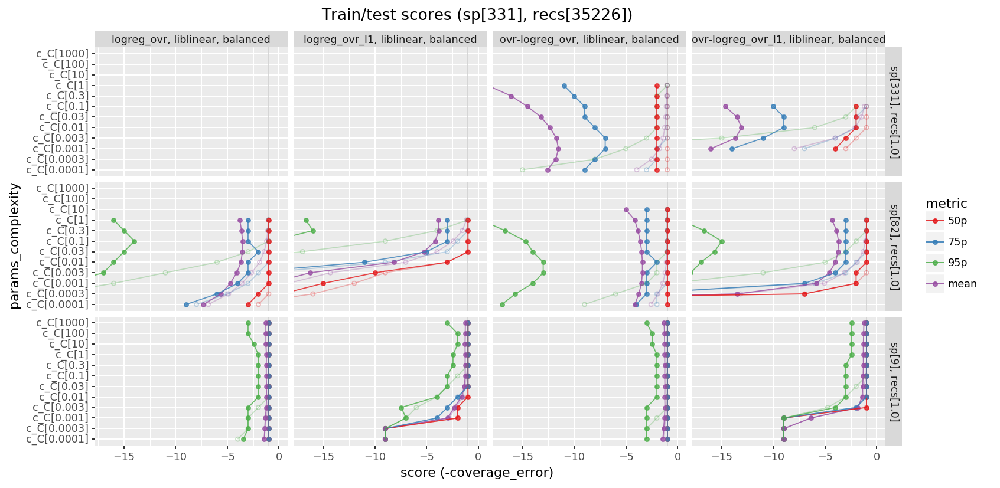

<ggplot: (8760493159439)>

In [ ]:
# Train/test scores
#   - Grain: models x {train,test}
#   - Metrics: score
#   - Dims: group, params
metrics = [
    'train_mean_score', 'test_mean_score',
    'train_50p_score', 'test_50p_score',
    'train_75p_score', 'test_75p_score',
    'train_95p_score', 'test_95p_score',
]
(cv_models
    .pipe(df_reverse_cat, 'params_complexity')
    .pipe(lambda df: pd.melt(df,
        id_vars=[
            'params', 'params_data', 'params_model', 'params_complexity',
            'params_data_and_model', 'params_model_and_complexity',
            'n_species', 'n_recs',
            'fold',
        ],
        value_vars=metrics,
        var_name='split_metric',
        value_name='score'),
    )
    .assign(
        split_metric=lambda df: df.split_metric.str.replace('_score', ''),
        split=lambda df: df.split_metric.str.split('_').str[0],
        metric=lambda df: df.split_metric.str.split('_').str[1],
        group=lambda df: df.params_complexity.str.cat(df.split_metric, '/'),
    )
    .pipe(df_ordered_cat,
        split_metric=[strip_endswith(x, '_score') for x in metrics],
        group=lambda df: reversed(df.group.unique()),
    )
    .pipe(lambda df: (df
        .pipe(ggplot)
        + aes(x='params_complexity')
        + aes(y='score')
        + aes(color='metric')
        # + facet_grid('params_data ~ params_model')
        + facet + theme_
        + geom_hline(yintercept=-1, color='lightgrey')  # -1 is the max score (1 is the min coverage_error)
        + geom_point(df[df.split == 'train'], alpha=.3, fill='none')
        + geom_point(df[df.split == 'test'], alpha=.8)
        + geom_line(df[df.split == 'train'], alpha=.3, mapping=aes(group='split_metric', color='metric'))
        + geom_line(df[df.split == 'test'], alpha=.8, mapping=aes(group='split_metric', color='metric'))
        # TODO How to manually add a legend that shows test:filled, train:unfilled?
        # + geom_jitter(fill='none', size=3, height=1e-9, width=.05)
        # + geom_count(aes(size='..n..')) + scale_size_area()
        # + stat_summary(aes(group='group'), fun_data='mean_cl_boot', random_state=0, geom='errorbar')
        + coord_flip(
            ylim=(-17, 0),
        )
        # + scale_y_continuous(breaks=np.arange(-10, 0))  # TODO TODO XXX
        + scale_color_cmap_d('Set1')
        + theme_figsize(width=figsize_width, aspect_ratio=1/1.5)
        + ylab('score (-coverage_error)')
        + ggtitle(f'Train/test scores ({recs_stats})')
    ))
)

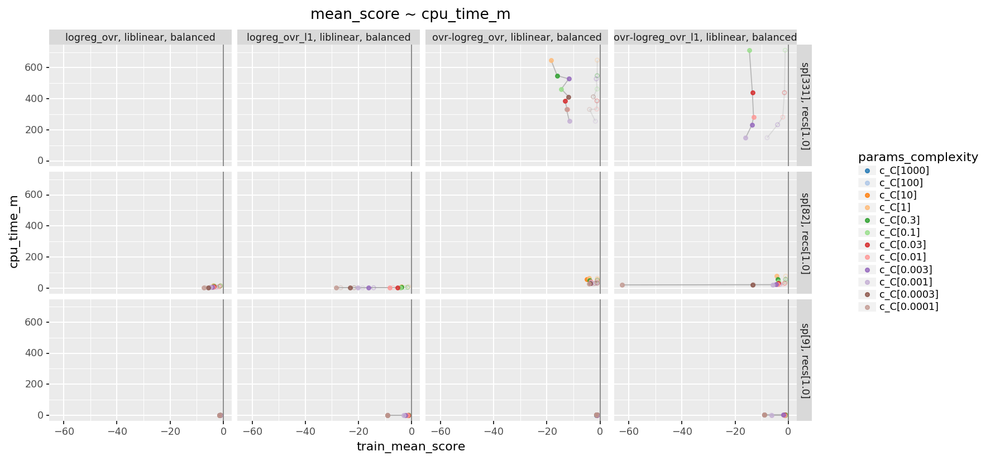

<ggplot: (-9223363276275130536)>

In [ ]:
(cv_models
    .pipe(ggplot)
    + aes(x='cpu_time_m')
    + aes(color='params_complexity')
    + facet + theme_
    + geom_line(aes(y='train_mean_score'), alpha=.3, color='darkgray')
    + geom_line(aes(y='test_mean_score'), alpha=.8, color='darkgray')
    + geom_point(aes(y='train_mean_score'), alpha=.3, fill='none')
    + geom_point(aes(y='test_mean_score'), alpha=.8)
    + geom_hline(yintercept=0, color='grey')
    + expand_limits(x=0)
    + coord_flip(
        # + ylim(-30, 0)
    )
    + scale_color_cmap_d(mpl_cmap_concat('tab20', 'tab20b', 'tab20c'))
    + guides(color=guide_legend(ncol=1)) + theme(legend_position='right', legend_box_spacing=.4, legend_key_height=8)
    + theme_figsize(width=figsize_width, aspect_ratio=1/1.5)
    + ggtitle('mean_score ~ cpu_time_m')
)

In [ ]:
(cv_models
    .pipe(ggplot)
    + aes(x='cpu_time_m')
    + aes(color='params_complexity')
    + facet + theme_
    + geom_line(aes(y='train_75p_score'), alpha=.3, color='darkgray')
    + geom_line(aes(y='test_75p_score'), alpha=.8, color='darkgray')
    + geom_point(aes(y='train_75p_score'), alpha=.3, fill='none')
    + geom_point(aes(y='test_75p_score'), alpha=.8)
    + geom_hline(yintercept=0, color='grey')
    + expand_limits(x=0)
    + coord_flip(
        # + ylim(-30, 0)
    )
    + scale_color_cmap_d(mpl_cmap_concat('tab20', 'tab20b', 'tab20c'))
    + guides(color=guide_legend(ncol=1)) + theme(legend_position='right', legend_box_spacing=.4, legend_key_height=8)
    + theme_figsize(width=figsize_width, aspect_ratio=1/1.5)
    + ggtitle('75p_score ~ cpu_time_m')
)

[skip]

In [ ]:
(cv_models
    .pipe(ggplot)
    + aes(x='model_size')
    + aes(color='params_complexity')
    + facet + theme_
    + geom_line(aes(y='train_75p_score'), alpha=.3, color='darkgray')
    + geom_line(aes(y='test_75p_score'), alpha=.8, color='darkgray')
    + geom_point(aes(y='train_75p_score'), alpha=.3, fill='none')
    + geom_point(aes(y='test_75p_score'), alpha=.8)
    + geom_hline(yintercept=0, color='grey')
    + scale_x_continuous(labels=labels_bytes(), breaks=breaks_bytes())
    + expand_limits(x=0)
    + coord_flip(
        # + ylim(-30, 0)
    )
    + scale_color_cmap_d(mpl_cmap_concat('tab20', 'tab20b', 'tab20c'))
    + guides(color=guide_legend(ncol=1)) + theme(legend_position='right', legend_box_spacing=.4, legend_key_height=8)
    + theme_figsize(width=figsize_width, aspect_ratio=1/1.5)
    + ggtitle('test_75p_score ~ model_size')
)

[skip]

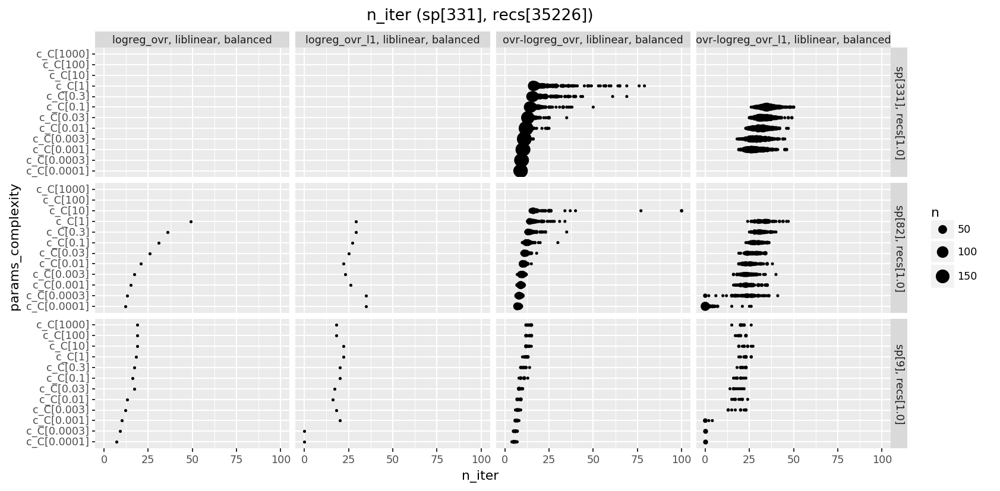

<ggplot: (-9223363276272265093)>

In [ ]:
# Tune n_iter
(cv_models
    .merge(how='left', on='model_id', right=df_flatmap(cv_models, lambda row: (
        dict(model_id=row.model_id, n_iter=n_iter)
        for n_iter in coalesce(row.n_iters, [0])
    )))
    # Manually compute y.mean() per group
    # .groupby('params').apply(lambda g: g.assign(cpu_time_m_mean=lambda df: df.cpu_time_m.mean()))
    .pipe(df_reverse_cat, 'params_complexity')
    .pipe(ggplot)
    + aes(x='params_complexity')
    + facet + theme_
    + geom_count(aes(y='n_iter', size='..n..')) + scale_size_area()
    + expand_limits(y=0)
    + coord_flip(
        ylim=(0, 100),  # TODO
    )
    + theme_figsize(width=figsize_width, aspect_ratio=1/1.5)
    + ggtitle(f'n_iter ({recs_stats})')
)

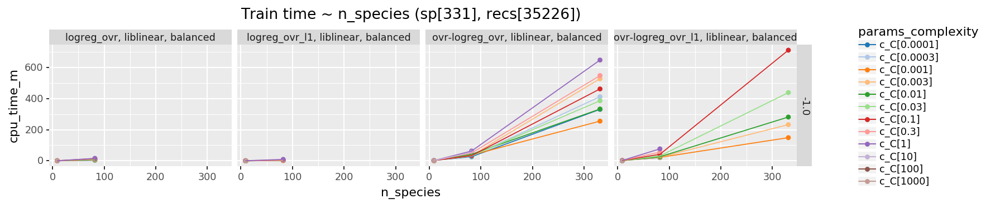

<ggplot: (-9223363276272305208)>

In [ ]:
# Train time ~ n_species
(cv_models
    .pipe(df_reverse_cat, 'params_complexity')
    .pipe(ggplot)
    + facet_grid('-n_recs ~ params_model')
    + aes(color='params_complexity')
    + aes(x='n_species', y='cpu_time_m')
    + geom_point()
    + geom_line()
    + scale_color_cmap_d(mpl_cmap_concat('tab20', 'tab20b', 'tab20c'))
    + guides(color=guide_legend(ncol=1)) + theme(legend_position='right', legend_box_spacing=.4, legend_key_height=8)
    + theme_figsize(width=figsize_width, aspect_ratio=1/1.5)
    + ggtitle(f'Train time ~ n_species ({recs_stats})')
)

/opt/conda/lib/python3.6/site-packages/plotnine/geoms/geom_path.py:81: UserWarning: geom_path: Each group consist of only one observation. Do you need to adjust the group aesthetic?
  warn("geom_path: Each group consist of only one "
/opt/conda/lib/python3.6/site-packages/plotnine/geoms/geom_path.py:81: UserWarning: geom_path: Each group consist of only one observation. Do you need to adjust the group aesthetic?
  warn("geom_path: Each group consist of only one "
/opt/conda/lib/python3.6/site-packages/plotnine/geoms/geom_path.py:81: UserWarning: geom_path: Each group consist of only one observation. Do you need to adjust the group aesthetic?
  warn("geom_path: Each group consist of only one "
/opt/conda/lib/python3.6/site-packages/plotnine/geoms/geom_path.py:81: UserWarning: geom_path: Each group consist of only one observation. Do you need to adjust the group aesthetic?
  warn("geom_path: Each group consist of only one "
/opt/conda/lib/python3.6/site-packages/plotnine/geoms/geom_path.

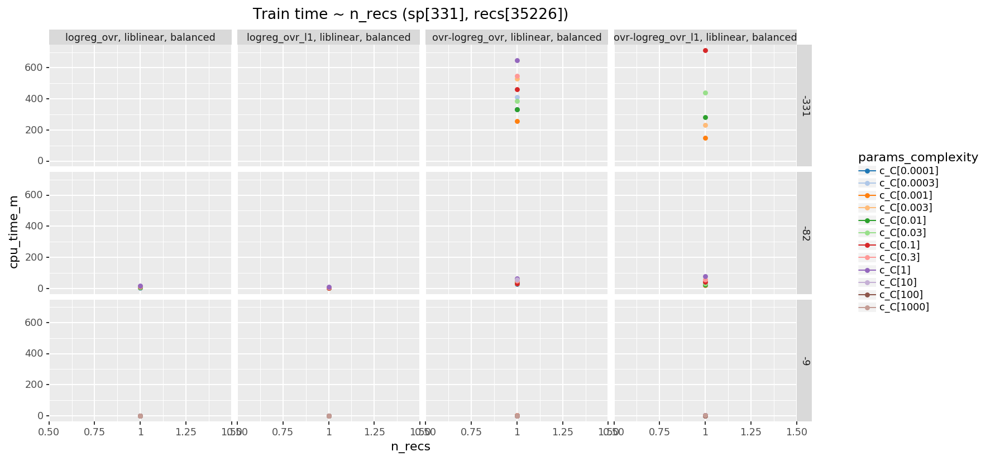

<ggplot: (8760582813872)>

In [ ]:
# Train time ~ n_recs
(cv_models
    .pipe(df_reverse_cat, 'params_complexity')
    .pipe(ggplot)
    + facet_grid('-n_species ~ params_model')
    + aes(color='params_complexity')
    + aes(x='n_recs', y='cpu_time_m')
    + geom_point()
    + geom_line()
    + scale_color_cmap_d(mpl_cmap_concat('tab20', 'tab20b', 'tab20c'))
    + guides(color=guide_legend(ncol=1)) + theme(legend_position='right', legend_box_spacing=.4, legend_key_height=8)
    + theme_figsize(width=figsize_width, aspect_ratio=1/1.5)
    + ggtitle(f'Train time ~ n_recs ({recs_stats})')
)

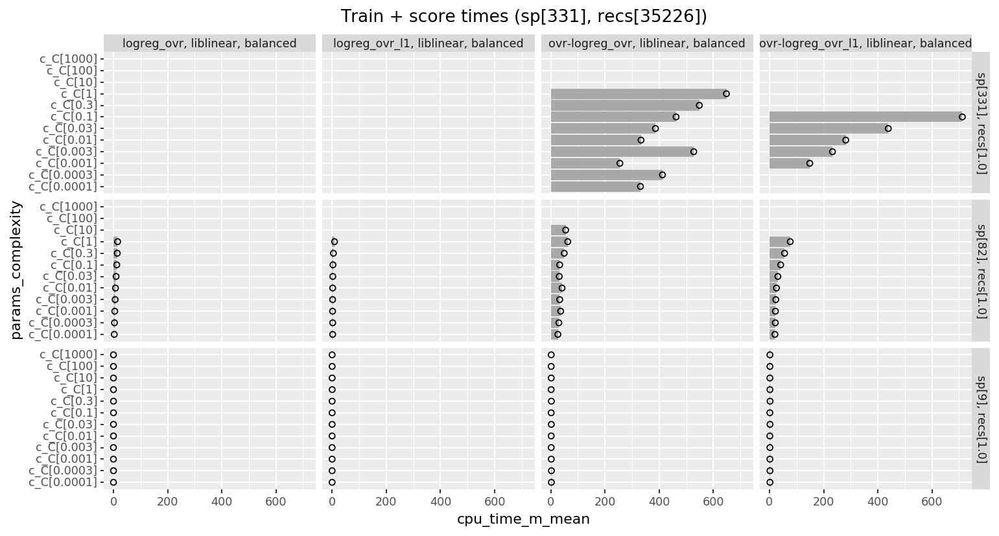

<ggplot: (-9223363276275367259)>

In [ ]:
(cv_models
    # Manually compute y.mean() per group
    .groupby('params').apply(lambda g: g.assign(cpu_time_m_mean=lambda df: df.cpu_time_m.mean()))
    .pipe(df_reverse_cat, 'params_complexity')
    .pipe(ggplot)
    + aes(x='params_complexity')
    + facet + theme_
    + geom_col(aes(y='cpu_time_m_mean'), fill='darkgray', position=position_dodge())
    + geom_point(aes(y='cpu_time_m'), color='black', fill='none', size=2)
    + coord_flip()
    + theme_figsize(width=figsize_width, aspect_ratio=1/1.5)
    + ggtitle(f'Train + score times ({recs_stats})')
)

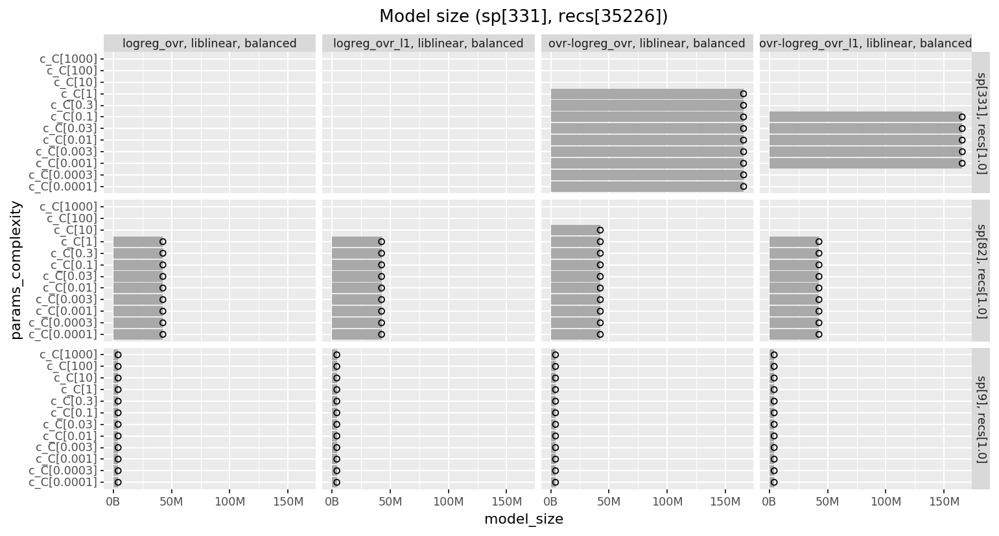

<ggplot: (-9223363276272195847)>

In [ ]:
(cv_models
    # Manually compute y.mean() per group
    .groupby('params').apply(lambda g: g.assign(model_size_mean=lambda df: df.model_size.mean()))
    .pipe(df_reverse_cat, 'params_complexity')
    .pipe(ggplot)
    + aes(x='params_complexity')
    + facet + theme_
    + geom_col(aes(y='model_size_mean'), fill='darkgray', position=position_dodge()) # Summary per fold
    + geom_point(aes(y='model_size'), color='black', fill='none', size=2) # Distribution of folds
    + scale_y_continuous(labels=labels_bytes(), breaks=breaks_bytes())
    + coord_flip()
    + ylab('model_size')
    + theme_figsize(width=figsize_width, aspect_ratio=1/1.5)
    + ggtitle(f'Model size ({recs_stats})')
)

In [ ]:
# TODO Make not barf on non-tree models (blocks rest of notebook)
(cv_models
    # Manually compute boxplot stats, else it's _really_ slow (or you have to downsample, which misses outliers)
    #   - Based on stat_boxplot.compute_group
    .merge(how='left', on='params', right=cv_models.groupby('params').apply(lambda g: one(
        pd.Series(dict(
            params=g.name,
            ymin=boxplot['whislo'],
            lower=boxplot['q1'],
            middle=boxplot['med'],
            upper=boxplot['q3'],
            ymax=boxplot['whishi'],
            outliers=np.unique(boxplot['fliers']),  # np.unique else really slow, because lots of repeated (int) points
        ))
        for [boxplot] in [mpl.cbook.boxplot_stats(  # [boxplot] is 1 elem because X.ndim = 1
            X=np.concatenate([[] if x is None else x.depth for x in g.model_stats]),
            whis=1.5,
        )]
    )))
    .pipe(df_reverse_cat, 'params_complexity')
    .pipe(ggplot)
    + aes(x='params_complexity')
    + facet + theme_
    + geom_boxplot(
        stat='identity',
        outlier_size=.5,
        mapping=aes(ymin='ymin', ymax='ymax', upper='upper', lower='lower', middle='middle', outliers='outliers',
            width=.8,  # Close enough to geom_boxplot defaults [TODO Maybe should compute based on num categorical x's?]
        ),
    )
    + ylab('tree_depth')
    + coord_flip()
    + theme_figsize(width=figsize_width, aspect_ratio=1/1.5)
    + ggtitle(f'Tree depth ({recs_stats})')
)

[skip]

In [ ]:
# SLOW_PLOTS_NEXT

# Model diagnostics: all models, all folds

In [ ]:
print('models:')
print('  params[*/%s]' % len(cv_models.params.cat.categories))
print('  fold[*/%s]' % cv.cv.n_splits)

models:
  params[*/99]
  fold[*/1]


In [ ]:
# TODO Cache
# Coverage errors: all models, all folds
#   - Subset: all models
#   - Grain: sum(recs[model.test_i] for model)
#   - Dims: model_id, params, fold, y_true, rec_id
#   - Metrics: coverage_error
coverage_errors_all_all = (cv_models
    # .sample(n=5, random_state=0)  # For faster dev
    .pipe(lambda df: DF(
        OrderedDict(
            # **row[['model_id', 'params', 'fold']],  # Slow (in this inner loop), unpack manually instead
            model_id=row.model_id,
            params=row.params,
            params_data=row.params_data,
            params_model=row.params_model,
            params_complexity=row.params_complexity,
            params_data_and_model=row.params_data_and_model,
            params_model_and_complexity=row.params_model_and_complexity,
            fold=row.fold,
            i=i,
            y_true=y_true,
            coverage_error=coverage_error,
        )
        for row in iter_progress(df_rows(df), n=len(df))
        for i, y_true, coverage_error in zip(
            row.test_evals.i,
            row.test_evals.y,
            row.test_evals.coverage_errors(),
        )
    ))
    .astype(dict(
        model_id=cv_models.model_id.dtype,
        params=cv_models.params.dtype,
        params_data=cv_models.params_data.dtype,
        params_model=cv_models.params_model.dtype,
        params_complexity=cv_models.params_complexity.dtype,
        params_data_and_model=cv_models.params_data_and_model.dtype,
        params_model_and_complexity=cv_models.params_model_and_complexity.dtype,
    ))
    .pipe(tap, lambda df: display(
        df_summary(df).T,
        df[:10],
    ))
)

  0%|                                                                                                        | 0/99 [00:00<?, ?it/s]

  6%|█████▊                                                                                          | 6/99 [00:00<00:01, 57.37it/s]

 12%|███████████▌                                                                                   | 12/99 [00:00<00:01, 57.88it/s]

 18%|█████████████████▎                                                                             | 18/99 [00:00<00:01, 55.19it/s]

 24%|███████████████████████                                                                        | 24/99 [00:00<00:01, 54.54it/s]

 30%|████████████████████████████▊                                                                  | 30/99 [00:00<00:01, 55.12it/s]

 36%|██████████████████████████████████▌                                                            | 36/99 [00:00<00:01, 55.55it/s]

 42%|████████████████████████████████████████▎                                                      | 42/99 [00:00<00:01, 55.78it/s]

 48%|██████████████████████████████████████████████                                                 | 48/99 [00:00<00:00, 56.25it/s]

 55%|███████████████████████████████████████████████████▊                                           | 54/99 [00:01<00:01, 28.57it/s]

 59%|███████████████████████████████████████████████████████▋                                       | 58/99 [00:02<00:01, 22.35it/s]

 62%|██████████████████████████████████████████████████████████▌                                    | 61/99 [00:03<00:01, 19.48it/s]

 65%|█████████████████████████████████████████████████████████████▍                                 | 64/99 [00:03<00:02, 17.42it/s]

 67%|███████████████████████████████████████████████████████████████▎                               | 66/99 [00:04<00:02, 16.38it/s]

 69%|█████████████████████████████████████████████████████████████████▎                             | 68/99 [00:04<00:02, 15.45it/s]

 71%|███████████████████████████████████████████████████████████████████▏                           | 70/99 [00:04<00:01, 14.70it/s]

 72%|████████████████████████████████████████████████████████████████████▏                          | 71/99 [00:04<00:01, 14.36it/s]

 73%|█████████████████████████████████████████████████████████████████████                          | 72/99 [00:05<00:01, 14.05it/s]

 74%|██████████████████████████████████████████████████████████████████████                         | 73/99 [00:05<00:01, 13.75it/s]

 75%|███████████████████████████████████████████████████████████████████████                        | 74/99 [00:05<00:01, 13.48it/s]

 76%|███████████████████████████████████████████████████████████████████████▉                       | 75/99 [00:05<00:01, 13.23it/s]

 77%|████████████████████████████████████████████████████████████████████████▉                      | 76/99 [00:05<00:01, 12.99it/s]

 78%|█████████████████████████████████████████████████████████████████████████▉                     | 77/99 [00:06<00:01, 12.75it/s]

 79%|██████████████████████████████████████████████████████████████████████████▊                    | 78/99 [00:06<00:01, 12.53it/s]

 80%|███████████████████████████████████████████████████████████████████████████▊                   | 79/99 [00:06<00:01, 12.32it/s]

 81%|████████████████████████████████████████████████████████████████████████████▊                  | 80/99 [00:06<00:01, 12.12it/s]

 82%|█████████████████████████████████████████████████████████████████████████████▋                 | 81/99 [00:06<00:01, 11.94it/s]

 83%|██████████████████████████████████████████████████████████████████████████████▋                | 82/99 [00:06<00:01, 11.78it/s]

 84%|███████████████████████████████████████████████████████████████████████████████▋               | 83/99 [00:07<00:01, 11.62it/s]

 85%|████████████████████████████████████████████████████████████████████████████████▌              | 84/99 [00:07<00:01, 11.46it/s]

 86%|█████████████████████████████████████████████████████████████████████████████████▌             | 85/99 [00:07<00:01, 11.31it/s]

 87%|██████████████████████████████████████████████████████████████████████████████████▌            | 86/99 [00:08<00:01, 10.38it/s]

 88%|███████████████████████████████████████████████████████████████████████████████████▍           | 87/99 [00:09<00:01,  9.60it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████▍          | 88/99 [00:09<00:01,  8.96it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████▍         | 89/99 [00:10<00:01,  8.38it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████▎        | 90/99 [00:11<00:01,  7.90it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████▎       | 91/99 [00:12<00:01,  7.49it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████▎      | 92/99 [00:12<00:00,  7.13it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████▏     | 93/99 [00:13<00:00,  6.81it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████▏    | 94/99 [00:14<00:00,  6.51it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████▏   | 95/99 [00:15<00:00,  6.12it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████   | 96/99 [00:16<00:00,  5.90it/s]

 98%|█████████████████████████████████████████████████████████████████████████████████████████████  | 97/99 [00:17<00:00,  5.69it/s]

 99%|██████████████████████████████████████████████████████████████████████████████████████████████ | 98/99 [00:17<00:00,  5.49it/s]

100%|███████████████████████████████████████████████████████████████████████████████████████████████| 99/99 [00:18<00:00,  5.32it/s]

,,,,,,,,min,25%,50%,75%,max
,dtype,sizeof,len,count,nunique,mean,std,,,,,
index,int64,1389624,173703,173703,173703,86851.000,50143.881,0,43425,86851,130276,173702
model_id,category,193028,173703,173703,99,NaN,NaN,"n_species[9], n_recs[1.0], c_cls[logreg_ovr],c_solver[liblinear],c_C[0.003],c_class_weight[balanced], fold[0]","n_species[82], n_recs[1.0], c_cls[ovr-logreg_ovr],c_solver[liblinear],c_C[0.0003],c_class_weight[balanced], fold[0]","n_species[331], n_recs[1.0], c_cls[ovr-logreg_ovr],c_solver[liblinear],c_C[0.0003],c_class_weight[balanced], fold[0]","n_species[331], n_recs[1.0], c_cls[ovr-logreg_ovr],c_solver[liblinear],c_C[0.1],c_class_weight[balanced], fold[0]","n_species[331], n_recs[1.0], c_cls[ovr-logreg_ovr_l1],c_solver[liblinear],c_C[0.1],c_class_weight[balanced], fold[0]"
params,category,192137,173703,173703,99,NaN,NaN,"n_species[9], n_recs[1.0], c_cls[logreg_ovr],c_solver[liblinear],c_C[0.003],c_class_weight[balanced]","n_species[82], n_recs[1.0], c_cls[ovr-logreg_ovr],c_solver[liblinear],c_C[0.0003],c_class_weight[balanced]","n_species[331], n_recs[1.0], c_cls[ovr-logreg_ovr],c_solver[liblinear],c_C[0.0003],c_class_weight[balanced]","n_species[331], n_recs[1.0], c_cls[ovr-logreg_ovr],c_solver[liblinear],c_C[0.1],c_class_weight[balanced]","n_species[331], n_recs[1.0], c_cls[ovr-logreg_ovr_l1],c_solver[liblinear],c_C[0.1],c_class_weight[balanced]"
params_data,category,174221,173703,173703,3,NaN,NaN,"sp[331], recs[1.0]","sp[331], recs[1.0]","sp[331], recs[1.0]","sp[82], recs[1.0]","sp[9], recs[1.0]"
params_model,category,174797,173703,173703,4,NaN,NaN,"logreg_ovr, liblinear, balanced","ovr-logreg_ovr, liblinear, balanced","ovr-logreg_ovr, liblinear, balanced","ovr-logreg_ovr_l1, liblinear, balanced","ovr-logreg_ovr_l1, liblinear, balanced"
params_complexity,category,175285,173703,173703,12,NaN,NaN,c_C[1000],c_C[0.1],c_C[0.01],c_C[0.001],c_C[0.0001]
params_data_and_model,category,175120,173703,173703,10,NaN,NaN,"sp[331], recs[1.0]\novr-logreg_ovr, liblinear, balanced","sp[331], recs[1.0]\novr-logreg_ovr, liblinear, balanced","sp[331], recs[1.0]\novr-logreg_ovr_l1, liblinear, balanced","sp[82], recs[1.0]\nlogreg_ovr_l1, liblinear, balanced","sp[9], recs[1.0]\novr-logreg_ovr_l1, liblinear, balanced"
params_model_and_complexity,category,179847,173703,173703,48,NaN,NaN,"logreg_ovr, liblinear, balanced\nc_C[1000]","ovr-logreg_ovr, liblinear, balanced\nc_C[1]","ovr-logreg_ovr, liblinear, balanced\nc_C[0.003]","ovr-logreg_ovr_l1, liblinear, balanced\nc_C[0.1]","ovr-logreg_ovr_l1, liblinear, balanced\nc_C[0.0001]"
fold,int64,1389624,173703,173703,1,0.000,0.000,0,0,0,0,0


,model_id,params,params_data,params_model,params_complexity,params_data_and_model,params_model_and_complexity,fold,i,y_true,coverage_error
0,"n_species[9], n_recs[1.0], c_cls[logreg_ovr],c_solver[liblinear],c_C[0.003],c_class_weight[balanced], fold[0]","n_species[9], n_recs[1.0], c_cls[logreg_ovr],c_solver[liblinear],c_C[0.003],c_class_weight[balanced]","sp[9], recs[1.0]","logreg_ovr, liblinear, balanced",c_C[0.003],"sp[9], recs[1.0]\nlogreg_ovr, liblinear, balanced","logreg_ovr, liblinear, balanced\nc_C[0.003]",0,1694,HOFI,1.0
1,"n_species[9], n_recs[1.0], c_cls[logreg_ovr],c_solver[liblinear],c_C[0.003],c_class_weight[balanced], fold[0]","n_species[9], n_recs[1.0], c_cls[logreg_ovr],c_solver[liblinear],c_C[0.003],c_class_weight[balanced]","sp[9], recs[1.0]","logreg_ovr, liblinear, balanced",c_C[0.003],"sp[9], recs[1.0]\nlogreg_ovr, liblinear, balanced","logreg_ovr, liblinear, balanced\nc_C[0.003]",0,33361,CAVI,2.0
2,"n_species[9], n_recs[1.0], c_cls[logreg_ovr],c_solver[liblinear],c_C[0.003],c_class_weight[balanced], fold[0]","n_species[9], n_recs[1.0], c_cls[logreg_ovr],c_solver[liblinear],c_C[0.003],c_class_weight[balanced]","sp[9], recs[1.0]","logreg_ovr, liblinear, balanced",c_C[0.003],"sp[9], recs[1.0]\nlogreg_ovr, liblinear, balanced","logreg_ovr, liblinear, balanced\nc_C[0.003]",0,30902,HOFI,1.0
3,"n_species[9], n_recs[1.0], c_cls[logreg_ovr],c_solver[liblinear],c_C[0.003],c_class_weight[balanced], fold[0]","n_species[9], n_recs[1.0], c_cls[logreg_ovr],c_solver[liblinear],c_C[0.003],c_class_weight[balanced]","sp[9], recs[1.0]","logreg_ovr, liblinear, balanced",c_C[0.003],"sp[9], recs[1.0]\nlogreg_ovr, liblinear, balanced","logreg_ovr, liblinear, balanced\nc_C[0.003]",0,15827,CAVI,1.0
4,"n_species[9], n_recs[1.0], c_cls[logreg_ovr],c_solver[liblinear],c_C[0.003],c_class_weight[balanced], fold[0]","n_species[9], n_recs[1.0], c_cls[logreg_ovr],c_solver[liblinear],c_C[0.003],c_class_weight[balanced]","sp[9], recs[1.0]","logreg_ovr, liblinear, balanced",c_C[0.003],"sp[9], recs[1.0]\nlogreg_ovr, liblinear, balanced","logreg_ovr, liblinear, balanced\nc_C[0.003]",0,20871,HOFI,1.0
5,"n_species[9], n_recs[1.0], c_cls[logreg_ovr],c_solver[liblinear],c_C[0.003],c_class_weight[balanced], fold[0]","n_species[9], n_recs[1.0], c_cls[logreg_ovr],c_solver[liblinear],c_C[0.003],c_class_weight[balanced]","sp[9], recs[1.0]","logreg_ovr, liblinear, balanced",c_C[0.003],"sp[9], recs[1.0]\nlogreg_ovr, liblinear, balanced","logreg_ovr, liblinear, balanced\nc_C[0.003]",0,28215,HOFI,3.0
6,"n_species[9], n_recs[1.0], c_cls[logreg_ovr],c_solver[liblinear],c_C[0.003],c_class_weight[balanced], fold[0]","n_species[9], n_recs[1.0], c_cls[logreg_ovr],c_solver[liblinear],c_C[0.003],c_class_weight[balanced]","sp[9], recs[1.0]","logreg_ovr, liblinear, balanced",c_C[0.003],"sp[9], recs[1.0]\nlogreg_ovr, liblinear, balanced","logreg_ovr, liblinear, balanced\nc_C[0.003]",0,26775,GRVI,1.0
7,"n_species[9], n_recs[1.0], c_cls[logreg_ovr],c_solver[liblinear],c_C[0.003],c_class_weight[balanced], fold[0]","n_species[9], n_recs[1.0], c_cls[logreg_ovr],c_solver[liblinear],c_C[0.003],c_class_weight[balanced]","sp[9], recs[1.0]","logreg_ovr, liblinear, balanced",c_C[0.003],"sp[9], recs[1.0]\nlogreg_ovr, liblinear, balanced","logreg_ovr, liblinear, balanced\nc_C[0.003]",0,32785,GRVI,1.0
8,"n_species[9], n_recs[1.0], c_cls[logreg_ovr],c_solver[liblinear],c_C[0.003],c_class_weight[balanced], fold[0]","n_species[9], n_recs[1.0], c_cls[logreg_ovr],c_solver[liblinear],c_C[0.003],c_class_weight[balanced]","sp[9], recs[1.0]","logreg_ovr, liblinear, balanced",c_C[0.003],"sp[9], recs[1.0]\nlogreg_ovr, liblinear, balanced","logreg_ovr, liblinear, balanced\nc_C[0.003]",0,2158,CAVI,1.0
9,"n_species[9], n_recs[1.0], c_cls[logreg_ovr],c_solver[liblinear],c_C[0.003],c_class_weight[balanced], fold[0]","n_species[9], n_recs[1.0], c_cls[logreg_ovr],c_solver[liblinear],c_C[0.003],c_class_weight[balanced]","sp[9], recs[1.0]","logreg_ovr, liblinear, balanced",c_C[0.003],"sp[9], recs[1.0]\

In [ ]:
[print(x) for x in coverage_errors_all_all.params_data.unique()];
params_data = (
    'sp[331], recs[1.0]'
)
n_species = parse.search('sp[{n_species:d}], recs[{n_recs:f}]', params_data)['n_species']
assert params_data in list(coverage_errors_all_all.params_data), params_data

sp[9], recs[1.0]
sp[82], recs[1.0]
sp[331], recs[1.0]


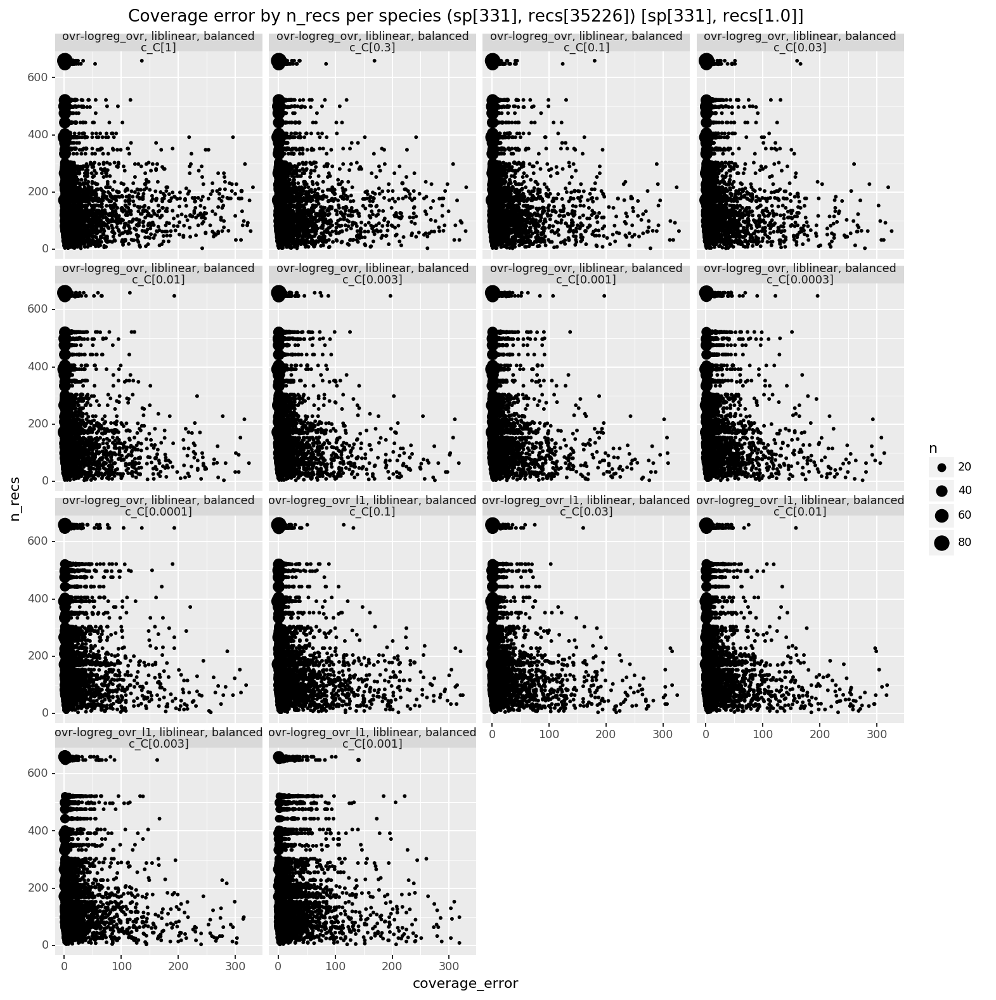

<ggplot: (-9223363276272339403)>

In [ ]:
# TODO Class imbalance
#   1. Is class imbalance causing a problem? [-> maybe]
#   2. Is class_weight solving it? [-> maybe a little bit]
#   - TODO Try again with larger class imbalance
(coverage_errors_all_all
    [lambda df: df.params_data == params_data]
    # .sample(100, random_state=0)  # Faster dev
    .merge(how='left', on='y_true', right=(recs
        .assign(n_recs=1).groupby('species')['n_recs'].sum().reset_index()
        .rename(columns={'species': 'y_true'})
    ))
    # .pipe(puts, f=lambda df: df[:3])  # XXX Debug
    .pipe(ggplot)
    # + facet_grid('params_complexity ~ params_model')
    + facet_wrap('params_model_and_complexity')
    + aes(x='n_recs', y='coverage_error')
    + geom_count(aes(size='..n..')) + scale_size_area()
    + expand_limits(x=0, y=0)
    + coord_flip()
    + theme_figsize(width=figsize_width, aspect_ratio=1/1)
    + ggtitle(rf'Coverage error by n_recs per species ({recs_stats}) [{params_data}]')
)

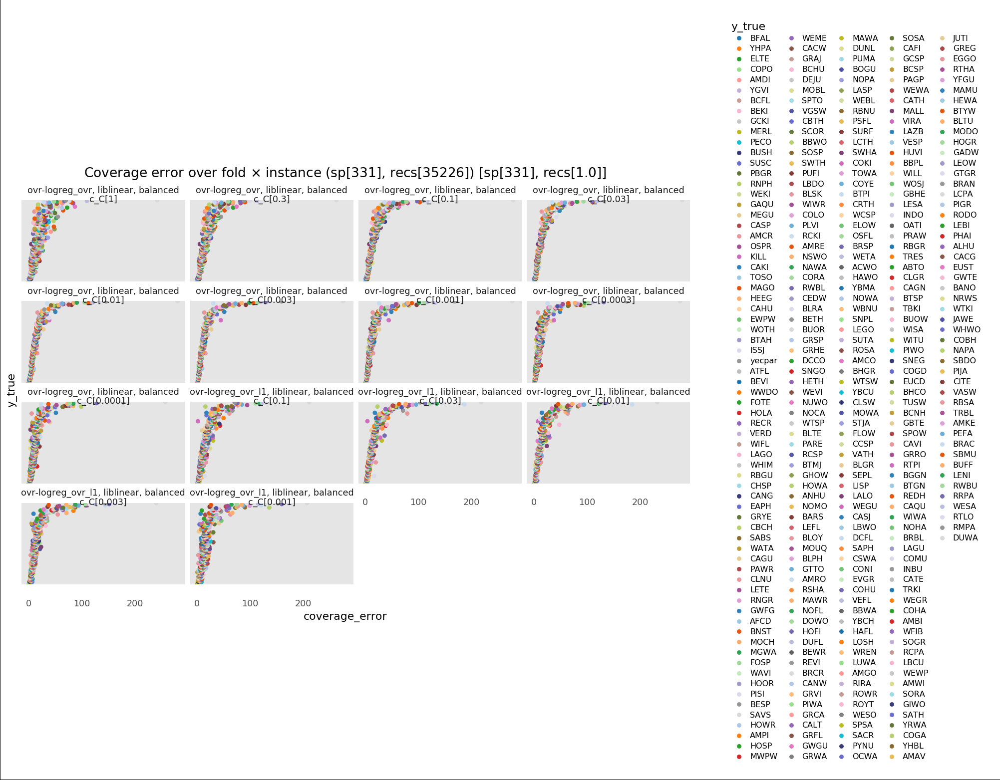

<ggplot: (-9223363276272696772)>

In [ ]:
# Facet by params_no_ns, order by mean(coverage_error)
#   - Subset: all models
#   - Grain: sum(recs[model.test_i].groupby(params, y_true) for model)
#       - Over: fold, rec_id
#   - Dims: params, y_true
#   - Metrics: coverage_error.mean
# in: coverage_errors_all_all, recs
(coverage_errors_all_all
    [lambda df: df.params_data == params_data]
    # .sample(100, random_state=0)  # Faster dev
    # .pipe(df_reverse_cat, 'params', 'params_no_ns', 'ns')
    .pipe(df_ordered_cat,
        y_true=lambda df: (
            # Sort species by mean(coverage_error) (across all models)
            df.groupby('y_true').agg({'coverage_error': np.mean}).reset_index().sort_values('coverage_error').y_true
            # Sort species by taxo (hard to compare across models, unless they're pretty low noise)
            # reversed(recs.species.cat.categories)
        ),
    )
    .pipe(ggplot)
    + aes(x='y_true', y='coverage_error')
    + aes(color='y_true')
    # + facet_grid('params_complexity ~ params_model')
    + facet_wrap('params_model_and_complexity',
        # Bug: dir='v' inverts nrow/ncol [https://github.com/has2k1/plotnine/issues/163]
        # dir='v', nrow=coverage_errors_all_all.params_model.nunique(),
    )
    # + geom_line(aes(group='params'), stat='summary', fun_y=np.mean)  # TODO Bad interpolation with n_species
    + geom_point(aes(group='params'), stat='summary', fun_y=np.mean)
    + coord_flip()
    # + geom_hline(yintercept=recs.species.nunique(), color='grey')
    + scale_color_cmap_d(mpl_cmap_repeat(10, 'tab20', 'tab20b', 'tab20c'))
    + theme_minimal_white()  # Before other theme()
    + guides(color=guide_legend(nrow=70))
    + theme(legend_position='right', legend_box_spacing=.4, legend_key_height=8, legend_text=element_text(size=8))
    + theme(axis_text_y=element_blank())
    + theme_figsize(width=figsize_width, aspect_ratio=1/2)
    + ggtitle(rf'Coverage error over fold $\times$ instance ({recs_stats}) [{params_data}]')
)

logreg_ovr, liblinear, balanced
logreg_ovr_l1, liblinear, balanced
ovr-logreg_ovr, liblinear, balanced
ovr-logreg_ovr_l1, liblinear, balanced


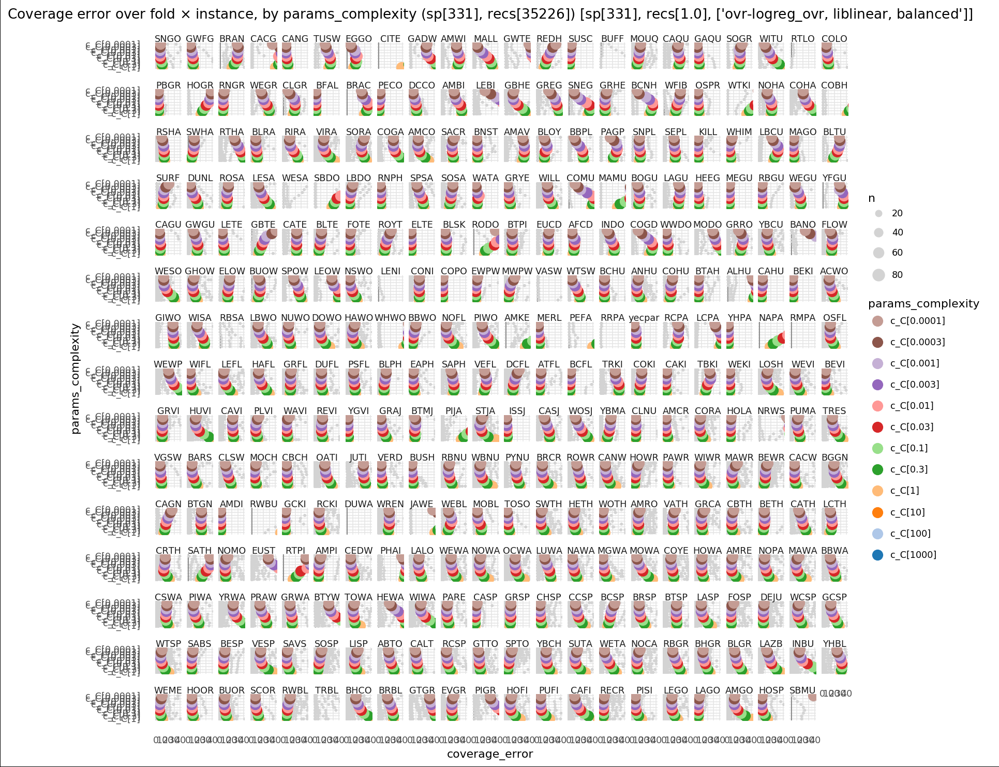

<ggplot: (8760493297584)>

In [ ]:
# TODO Slow, bad for notebook dev loop -- move lower, or disable by default?
# Facet by species
#   - Subset: all models
#   - Grain: sum(recs[model.test_i].groupby(params, y_true) for model)
#       - Over: fold, rec_id
#   - Dims: params, y_true
#   - Metrics: coverage_error.mean
# in: coverage_errors_all_all, recs
[print(x) for x in coverage_errors_all_all.params_model.unique()];
params_model = [
    # 'logreg_ovr, liblinear, balanced',
    # 'logreg_ovr_l1, liblinear, balanced',
    'ovr-logreg_ovr, liblinear, balanced',
    # 'ovr-logreg_ovr_l1, liblinear, balanced',
]
(coverage_errors_all_all
    [lambda df: df.params_data == params_data]
    [lambda df: df.params_model.isin(params_model)]
    # .sample(200, random_state=0)  # Faster dev
    # [lambda df: df.y_true.isin(df.y_true.drop_duplicates().sample(n=3, random_state=0))]  # Faster dev
    .astype({'y_true': metadata.species.df.shorthand.dtype})
    # .pipe(df_reverse_cat, 'params_complexity')
    .pipe(ggplot)
    + aes(x='params_complexity', y='coverage_error')
    + aes(color='params_complexity')
    + facet_wrap('y_true',
        ncol=int((n_species * 1/(2/3)) ** .5),
    )
    + geom_hline(yintercept=1, color='grey')
    # + geom_hline(yintercept=recs.species.nunique(), color='grey')
    # Percentiles (faster, no overplot)
    # + geom_point(stat='summary', fun_y=np.mean)
    # + geom_linerange(stat='summary', fun_ymin=partial(np.percentile, q=25), fun_ymax=partial(np.percentile, q=75))
    # Violin (slow, no overplot)
    # + geom_violin()
    # Boxplot (very slow, no overplot)
    # + geom_boxplot()
    # Points (medium cost, high overplot)
    #   - n (count) instead of prop (proportion)
    #   - scale_size_area() instead of default scale_size(), because it's a count [I don't grok this but it looks good]
    + geom_count(aes(size='..n..'), color='lightgray')
    + scale_size_area()
    # + geom_point(stat='summary', fun_y=np.mean, shape='|', size=5, stroke=2)
    + geom_point(stat='summary', fun_y=np.mean, size=5)
    + coord_flip(
        ylim=(0, 40),
    )
    # + scale_color_cmap_d(mpl_cmap_repeat(10, 'tab10'))  # Strong
    + scale_color_cmap_d(mpl_cmap_repeat(1, 'tab20', 'tab20b', 'tab20c'))  # FIXME repeat(10) makes lots of blue/gray
    + guides(color=guide_legend(reverse=True))
    + theme(axis_text_y=element_text(size=6))
    + theme_minimal_white()  # [TODO Before other theme()]
    + theme_figsize(width=figsize_width, aspect_ratio=1/1)
    + ggtitle(rf'Coverage error over fold $\times$ instance, by params_complexity ({recs_stats}) [{params_data}, {params_model}]')
)

c_C[0.003]
c_C[0.0003]
c_C[0.0001]
c_C[0.03]
c_C[0.3]
c_C[0.001]
c_C[0.01]
c_C[0.1]
c_C[1]
c_C[10]
c_C[100]
c_C[1000]


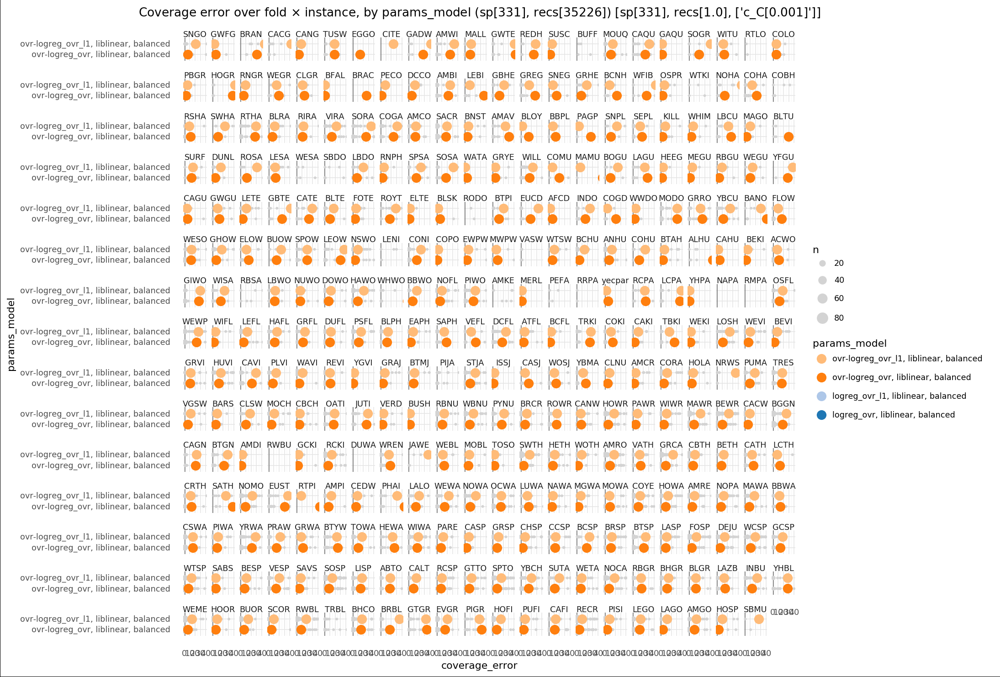

<ggplot: (-9223363276272070407)>

In [ ]:
# TODO Slow, bad for notebook dev loop -- move lower, or disable by default?
# Facet by species
#   - Subset: all models
#   - Grain: sum(recs[model.test_i].groupby(params, y_true) for model)
#       - Over: fold, rec_id
#   - Dims: params, y_true
#   - Metrics: coverage_error.mean
# in: coverage_errors_all_all, recs
[print(x) for x in coverage_errors_all_all.params_complexity.unique()];
params_complexity = [
    # 'c_C[0.1]',
    'c_C[0.001]',
    # '',
]
(coverage_errors_all_all
    [lambda df: df.params_data == params_data]
    [lambda df: df.params_complexity.isin(params_complexity)]
    # [lambda df: df.params.astype(str).str.contains(r'c_n_estimators\[100\]')]  # XXX Subset models
    # .sample(200, random_state=0)  # Faster dev
    # [lambda df: df.y_true.isin(df.y_true.drop_duplicates().sample(n=3, random_state=0))]  # Faster dev
    .astype({'y_true': metadata.species.df.shorthand.dtype})
    # .pipe(df_reverse_cat, 'params_model')
    .pipe(ggplot)
    + aes(x='params_model', y='coverage_error')
    + aes(color='params_model')
    + facet_wrap('y_true',
        ncol=int((n_species * 1/(2/3)) ** .5),
    )
    + geom_hline(yintercept=1, color='grey')
    # + geom_hline(yintercept=recs.species.nunique(), color='grey')
    # Percentiles (faster, no overplot)
    # + geom_point(stat='summary', fun_y=np.mean)
    # + geom_linerange(stat='summary', fun_ymin=partial(np.percentile, q=25), fun_ymax=partial(np.percentile, q=75))
    # Violin (slow, no overplot)
    # + geom_violin()
    # Boxplot (very slow, no overplot)
    # + geom_boxplot()
    # Points (medium cost, high overplot)
    #   - n (count) instead of prop (proportion)
    #   - scale_size_area() instead of default scale_size(), because it's a count [I don't grok this but it looks good]
    + geom_count(aes(size='..n..'), color='lightgray')
    + scale_size_area()
    # + geom_point(stat='summary', fun_y=np.mean, shape='|', size=5, stroke=2)
    + geom_point(stat='summary', fun_y=np.mean, size=5)
    + coord_flip(
        ylim=(0, 40),
    )
    + scale_color_cmap_d(mpl_cmap_repeat(1, 'tab20', 'tab20b', 'tab20c'))  # FIXME repeat(10) makes lots of blue/gray
    + guides(color=guide_legend(reverse=True))
    + theme(axis_text_y=element_text(size=6))
    + theme_minimal_white()  # [TODO Before other theme()]
    + theme_figsize(width=figsize_width, aspect_ratio=1/1)
    + ggtitle(rf'Coverage error over fold $\times$ instance, by params_model ({recs_stats}) [{params_data}, {params_complexity}]')
)

In [ ]:
# ONE_MODEL_PLOTS_NEXT

# Model diagnostics: one model, all folds

In [ ]:
params = (
    'n_species[331], n_recs[1.0], c_cls[ovr-logreg_ovr],c_solver[liblinear],c_C[0.001],c_class_weight[balanced]'
)
# Add params_l1 to compare to l2 (params)
params_l1 = (
    'n_species[331], n_recs[1.0], c_cls[ovr-logreg_ovr_l1],c_solver[liblinear],c_C[0.01],c_class_weight[balanced]'
)
print("params:\n%s" % '\n'.join('  %s: %r' % (i, x) for i, x in enumerate(cv_models.params.cat.categories)))
print()
print('models:')
params_i = list(cv_models.params.cat.categories).index(params)
print('  params[%s/%s]: %r' % (params_i, len(cv_models.params.cat.categories), params))
print('  fold[*/%s]' % cv.cv.n_splits)

params:
  0: 'n_species[9], n_recs[1.0], c_cls[logreg_ovr],c_solver[liblinear],c_C[0.003],c_class_weight[balanced]'
  1: 'n_species[9], n_recs[1.0], c_cls[logreg_ovr],c_solver[liblinear],c_C[0.0003],c_class_weight[balanced]'
  2: 'n_species[9], n_recs[1.0], c_cls[logreg_ovr],c_solver[liblinear],c_C[0.0001],c_class_weight[balanced]'
  3: 'n_species[9], n_recs[1.0], c_cls[logreg_ovr],c_solver[liblinear],c_C[0.03],c_class_weight[balanced]'
  4: 'n_species[9], n_recs[1.0], c_cls[logreg_ovr],c_solver[liblinear],c_C[0.3],c_class_weight[balanced]'
  5: 'n_species[9], n_recs[1.0], c_cls[logreg_ovr],c_solver[liblinear],c_C[0.001],c_class_weight[balanced]'
  6: 'n_species[9], n_recs[1.0], c_cls[logreg_ovr],c_solver[liblinear],c_C[0.01],c_class_weight[balanced]'
  7: 'n_species[9], n_recs[1.0], c_cls[logreg_ovr],c_solver[liblinear],c_C[0.1],c_class_weight[balanced]'
  8: 'n_species[9], n_recs[1.0], c_cls[logreg_ovr],c_solver[liblinear],c_C[1],c_class_weight[balanced]'
  9: 'n_species[9], n_recs[1

In [ ]:
# Coverage errors: one model, all folds
#   - Subset: models.params == params
#   - Grain: sum(recs[model.test_i] for model)
#   - Dims: model_id, params, fold, y_true, rec_id
#   - Metrics: coverage_error
coverage_errors_one_all = (coverage_errors_all_all
    [lambda df: df.params == params]  # One model, all folds
)
display(
    df_summary(coverage_errors_one_all).T,
    coverage_errors_one_all[:5],
)

,,,,,,,,min,25%,50%,75%,max
,dtype,sizeof,len,count,nunique,mean,std,,,,,
index,int64,56336,7042,7042,7042,113845.500,2032.995,110325,112085,113845,115605,117366
model_id,category,26367,7042,7042,1,NaN,NaN,"n_species[331], n_recs[1.0], c_cls[ovr-logreg_ovr],c_solver[liblinear],c_C[0.001],c_class_weight[balanced], fold[0]","n_species[331], n_recs[1.0], c_cls[ovr-logreg_ovr],c_solver[liblinear],c_C[0.001],c_class_weight[balanced], fold[0]","n_species[331], n_recs[1.0], c_cls[ovr-logreg_ovr],c_solver[liblinear],c_C[0.001],c_class_weight[balanced], fold[0]","n_species[331], n_recs[1.0], c_cls[ovr-logreg_ovr],c_solver[liblinear],c_C[0.001],c_class_weight[balanced], fold[0]","n_species[331], n_recs[1.0], c_cls[ovr-logreg_ovr],c_solver[liblinear],c_C[0.001],c_class_weight[balanced], fold[0]"
params,category,25476,7042,7042,1,NaN,NaN,"n_species[331], n_recs[1.0], c_cls[ovr-logreg_ovr],c_solver[liblinear],c_C[0.001],c_class_weight[balanced]","n_species[331], n_recs[1.0], c_cls[ovr-logreg_ovr],c_solver[liblinear],c_C[0.001],c_class_weight[balanced]","n_species[331], n_recs[1.0], c_cls[ovr-logreg_ovr],c_solver[liblinear],c_C[0.001],c_class_weight[balanced]","n_species[331], n_recs[1.0], c_cls[ovr-logreg_ovr],c_solver[liblinear],c_C[0.001],c_class_weight[balanced]","n_species[331], n_recs[1.0], c_cls[ovr-logreg_ovr],c_solver[liblinear],c_C[0.001],c_class_weight[balanced]"
params_data,category,7560,7042,7042,1,NaN,NaN,"sp[331], recs[1.0]","sp[331], recs[1.0]","sp[331], recs[1.0]","sp[331], recs[1.0]","sp[331], recs[1.0]"
params_model,category,8136,7042,7042,1,NaN,NaN,"ovr-logreg_ovr, liblinear, balanced","ovr-logreg_ovr, liblinear, balanced","ovr-logreg_ovr, liblinear, balanced","ovr-logreg_ovr, liblinear, balanced","ovr-logreg_ovr, liblinear, balanced"
params_complexity,category,8624,7042,7042,1,NaN,NaN,c_C[0.001],c_C[0.001],c_C[0.001],c_C[0.001],c_C[0.001]
params_data_and_model,category,8459,7042,7042,1,NaN,NaN,"sp[331], recs[1.0]\novr-logreg_ovr, liblinear, balanced","sp[331], recs[1.0]\novr-logreg_ovr, liblinear, balanced","sp[331], recs[1.0]\novr-logreg_ovr, liblinear, balanced","sp[331], recs[1.0]\novr-logreg_ovr, liblinear, balanced","sp[331], recs[1.0]\novr-logreg_ovr, liblinear, balanced"
params_model_and_complexity,category,13186,7042,7042,1,NaN,NaN,"ovr-logreg_ovr, liblinear, balanced\nc_C[0.001]","ovr-logreg_ovr, liblinear, balanced\nc_C[0.001]","ovr-logreg_ovr, liblinear, balanced\nc_C[0.001]","ovr-logreg_ovr, liblinear, balanced\nc_C[0.001]","ovr-logreg_ovr, liblinear, balanced\nc_C[0.001]"
fold,int64,56336,7042,7042,1,0.000,0.000,0,0,0,0,0


,model_id,params,params_data,params_model,params_complexity,params_data_and_model,params_model_and_complexity,fold,i,y_true,coverage_error
110325,"n_species[331], n_recs[1.0], c_cls[ovr-logreg_ovr],c_solver[liblinear],c_C[0.001],c_class_weight[balanced], fold[0]","n_species[331], n_recs[1.0], c_cls[ovr-logreg_ovr],c_solver[liblinear],c_C[0.001],c_class_weight[balanced]","sp[331], recs[1.0]","ovr-logreg_ovr, liblinear, balanced",c_C[0.001],"sp[331], recs[1.0]\novr-logreg_ovr, liblinear, balanced","ovr-logreg_ovr, liblinear, balanced\nc_C[0.001]",0,1694,RSHA,3.0
110326,"n_species[331], n_recs[1.0], c_cls[ovr-logreg_ovr],c_solver[liblinear],c_C[0.001],c_class_weight[balanced], fold[0]","n_species[331], n_recs[1.0], c_cls[ovr-logreg_ovr],c_solver[liblinear],c_C[0.001],c_class_weight[balanced]","sp[331], recs[1.0]","ovr-logreg_ovr, liblinear, balanced",c_C[0.001],"sp[331], recs[1.0]\novr-logreg_ovr, liblinear, balanced","ovr-logreg_ovr, liblinear, balanced\nc_C[0.001]",0,33361,HOFI,1.0
110327,"n_species[331], n_recs[1.0], c_cls[ovr-logreg_ovr],c_solver[liblinear],c_C[0.001],c_class_weight[balanced], fold[0]","n_species[331], n_recs[1.0], c_cls[ovr-logreg_ovr],c_solver[liblinear],c_C[0.001],c_class_weight[balanced]","sp[331], recs[1.0]","ovr-logreg_ovr, liblinear, balanced",c_C[0.001],"sp[331], recs[1.0]\novr-logreg_ovr, liblinear, balanced","ovr-logreg_ovr, liblinear, balanced\nc_C[0.001]",0,30902,BHGR,1.0
110328,"n_species[331], n_recs[1.0], c_cls[ovr-logreg_ovr],c_solver[liblinear],c_C[0.001],c_class_weight[balanced], fold[0]","n_species[331], n_recs[1.0], c_cls[ovr-logreg_ovr],c_solver[liblinear],c_C[0.001],c_class_weight[balanced]","sp[331], recs[1.0]","ovr-logreg_ovr, liblinear, balanced",c_C[0.001],"sp[331], recs[1.0]\novr-logreg_ovr, liblinear, balanced","ovr-logreg_ovr, liblinear, balanced\nc_C[0.001]",0,15827,HOWR,1.0
110329,"n_species[331], n_recs[1.0], c_cls[ovr-logreg_ovr],c_solver[liblinear],c_C[0.001],c_class_weight[balanced], fold[0]","n_species[331], n_recs[1.0], c_cls[ovr-logreg_ovr],c_solver[liblinear],c_C[0.001],c_class_weight[balanced]","sp[331], recs[1.0]","ovr-logreg_ovr, liblinear, balanced",c_C[0.001],"sp[331], recs[1.0]\novr-logreg_ovr, liblinear, balanced","ovr-logreg_ovr, liblinear, balanced\nc_C[0.001]",0,20871,NOMO,1.0


n_species[331], n_recs[1.0], c_cls[ovr-logreg_ovr],c_solver[liblinear],c_C[0.001],c_class_weight[balanced]


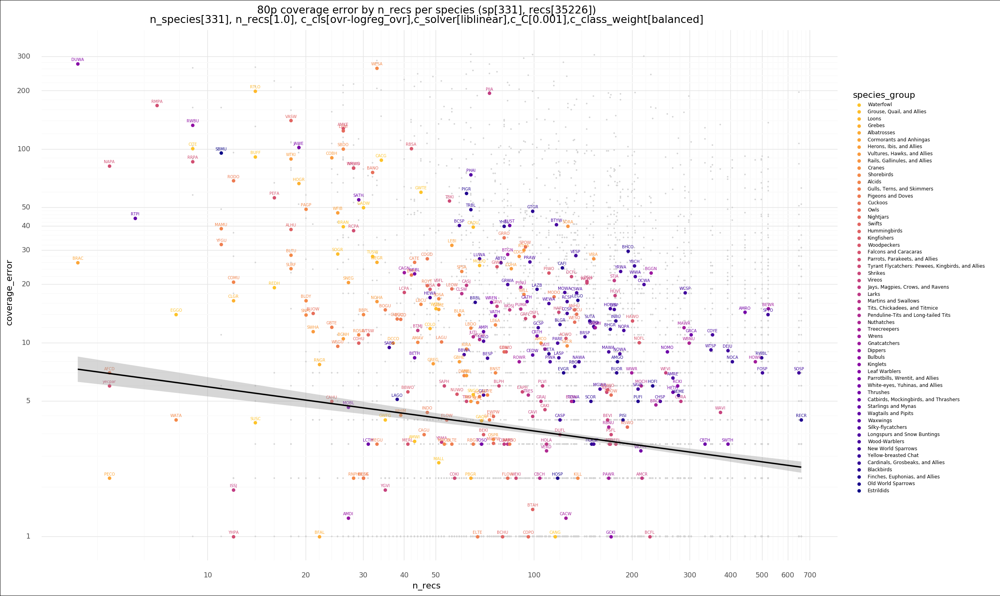

n_species[331], n_recs[1.0], c_cls[ovr-logreg_ovr_l1],c_solver[liblinear],c_C[0.01],c_class_weight[balanced]


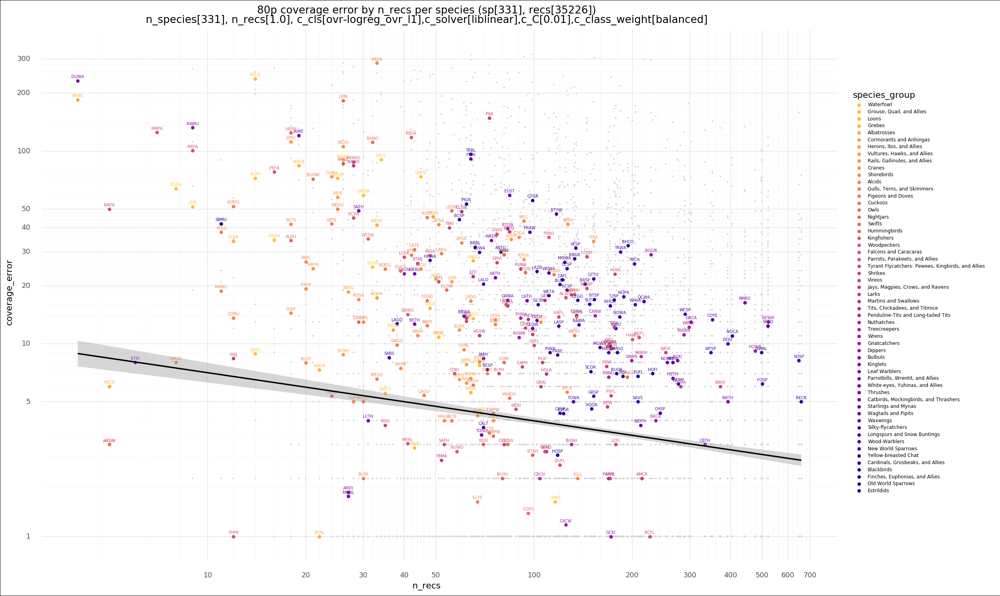

In [ ]:
# Coverage error by n_recs per species
#   - Compare l2 vs. l1
scale = [
    # 'linear',
    # 'logy',
    'logy', 'logx',
]
summary_fun_y = (
    # 'mean'
    # '75p'
    '80p'
    # '90p'
)
summary_fun = lambda s: (
    np.mean if s == 'mean' else
    partial(np.percentile, q=parse.parse('{:g}p', s)[0])
)
logy_breaks=[1, 5, 10, 20, 30, 40, 50, 100, 200, 300]  # HACK Data dependent
logx_breaks=[1, 10, 20, 30, 40, 50, 100, 200, 300, 400, 500, 600, 700]  # HACK Data dependent
for _params in [
    params,
    params_l1,
]:
    print(_params)
    repr(coverage_errors_all_all
        [lambda df: df.params == _params]  # One model, all folds
        # .sample(n=100, random_state=0)  # XXX Faster dev
        .merge(how='left', on='y_true', right=(recs
            .assign(n_recs=1).groupby('species')['n_recs'].sum().reset_index()
            .rename(columns={'species': 'y_true'})
        ))
        .merge(how='left', on='y_true', right=(metadata.species.df
            [['shorthand', 'species_group', 'family', 'order']]
            .rename(columns={'shorthand': 'y_true'})
        ))
        .astype({'y_true': metadata.species.df.shorthand.dtype})
        .pipe(df_reverse_cat, 'y_true')
        .pipe(df_remove_unused_categories)
        .pipe(ggplot)
        + theme_figsize('inline')
        + aes(x='n_recs', y='coverage_error')
        + geom_point(color='lightgray', size=.1)
        + stat_summary(
            fun_y=summary_fun(summary_fun_y),
            geom='point',
            mapping=aes(
                group='y_true', color='species_group',  # Color by species_group
                # group='y_true', color='y_true',  # Color by species
            ),
        )
        + stat_summary(
            fun_y=summary_fun(summary_fun_y),
            geom='text', size=5,
            mapping=aes(
                group='y_true', label='y_true', color='species_group',  # Color by species_group
                # group='y_true', color='y_true', label='y_true',  # Color by species
                # group='y_true', color='y_true', label='''[  # Color by species, label only if f(x,y)
                #     color if y >= 30 or x >= 300 else None  # (Great trick!)
                #     for color, x, y in zip(..color.., ..x.., ..y..)
                # ]''',
            ),
            nudge_y=4 if 'logy' not in scale else .02,
        )
        + geom_smooth(method='lm', se=True)
        + theme_minimal_white()  # Before other theme()
        + (geom_blank() if 'logy' not in scale else scale_y_log10(
            breaks=logy_breaks,
            labels=lambda breaks: [int(round(x)) for x in breaks],
        ))
        + (geom_blank() if 'logx' not in scale else scale_x_log10(
            breaks=logx_breaks,
            labels=lambda breaks: [int(round(x)) for x in breaks],
        ))
        + scale_color_cmap_d(mpl_cmap_with_colors('plasma_r', lambda colors: colors[256//8:]))  # Exclude the hard-to-see yellows
        # + guides(color=False)
        + guides(color=guide_legend(ncol=1))
        + theme(legend_position='right', legend_key_height=8, legend_text=element_text(size=6), legend_entry_spacing=0)
        + theme_figsize(width=18)
        + ggtitle(f'{summary_fun_y} coverage error by n_recs per species ({recs_stats})\n{_params}')
    )

n_species[331], n_recs[1.0], c_cls[ovr-logreg_ovr],c_solver[liblinear],c_C[0.001],c_class_weight[balanced]


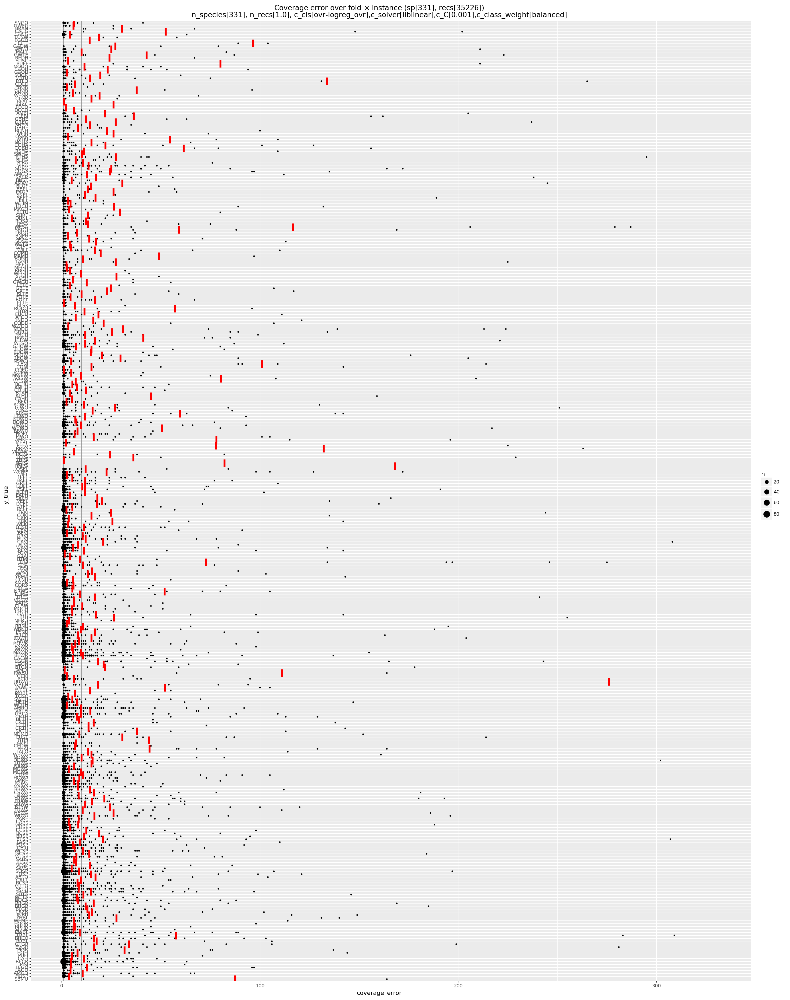

n_species[331], n_recs[1.0], c_cls[ovr-logreg_ovr_l1],c_solver[liblinear],c_C[0.01],c_class_weight[balanced]


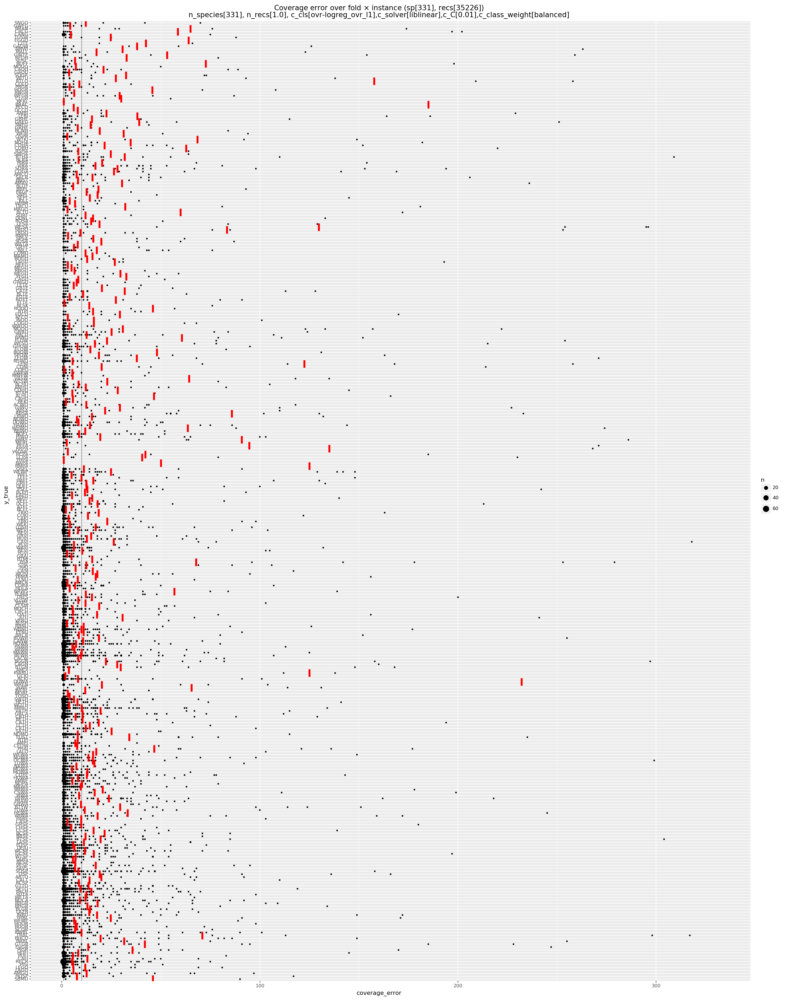

In [ ]:
#   - Subset: models.params == params
#   - Grain: sum(recs[model.test_i].groupby(y_true) for model)
#       - Over: fold, rec_id
#   - Dims: y_true
#   - Metrics: count, coverage_error.percentiles
# in: coverage_errors_one_all, recs
for _params in [params, params_l1]:
    print(_params)
    repr(coverage_errors_all_all
        [lambda df: df.params == _params]  # One model, all folds
        .astype({'y_true': metadata.species.df.shorthand.dtype})
        .pipe(df_reverse_cat, 'y_true')
        .pipe(ggplot, aes(x='y_true', y='coverage_error'))
        + geom_hline(yintercept=1, color='grey')
        + geom_hline(yintercept=10, color='grey')
        # + geom_hline(yintercept=recs.species.nunique(), color='grey')
        + geom_count(aes(size='..n..'), alpha=1)  # n (count) instead of prop (proportion)
        + scale_size_area()  # Instead of default scale_size(), because it's a count [I don't grok this but it looks good]
        + geom_point(stat='summary', fun_y=np.mean, alpha=1, color='red', shape='|', size=6, stroke=2)
        + coord_flip(
            ylim=(1, n_species),
        )
        # + theme_figsize('inline')
        # + theme_figsize('square')
        # + theme_figsize('half')
        + theme_figsize('half_dense')
        # + theme_figsize('full')
        # + theme_figsize('full_dense')
        + ggtitle(f'Coverage error over fold $\\times$ instance ({recs_stats})\n{_params}')
    )

n_species[331], n_recs[1.0], c_cls[ovr-logreg_ovr],c_solver[liblinear],c_C[0.001],c_class_weight[balanced]


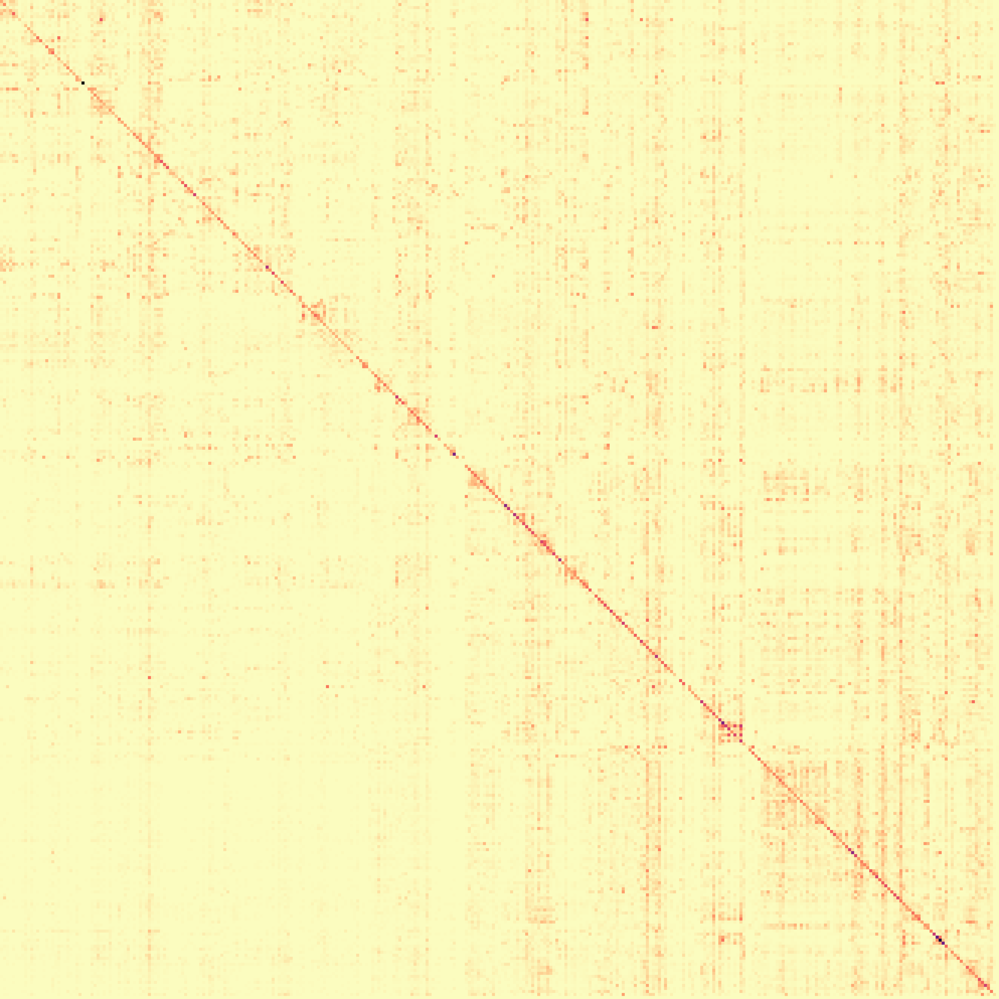

n_species[331], n_recs[1.0], c_cls[ovr-logreg_ovr_l1],c_solver[liblinear],c_C[0.01],c_class_weight[balanced]


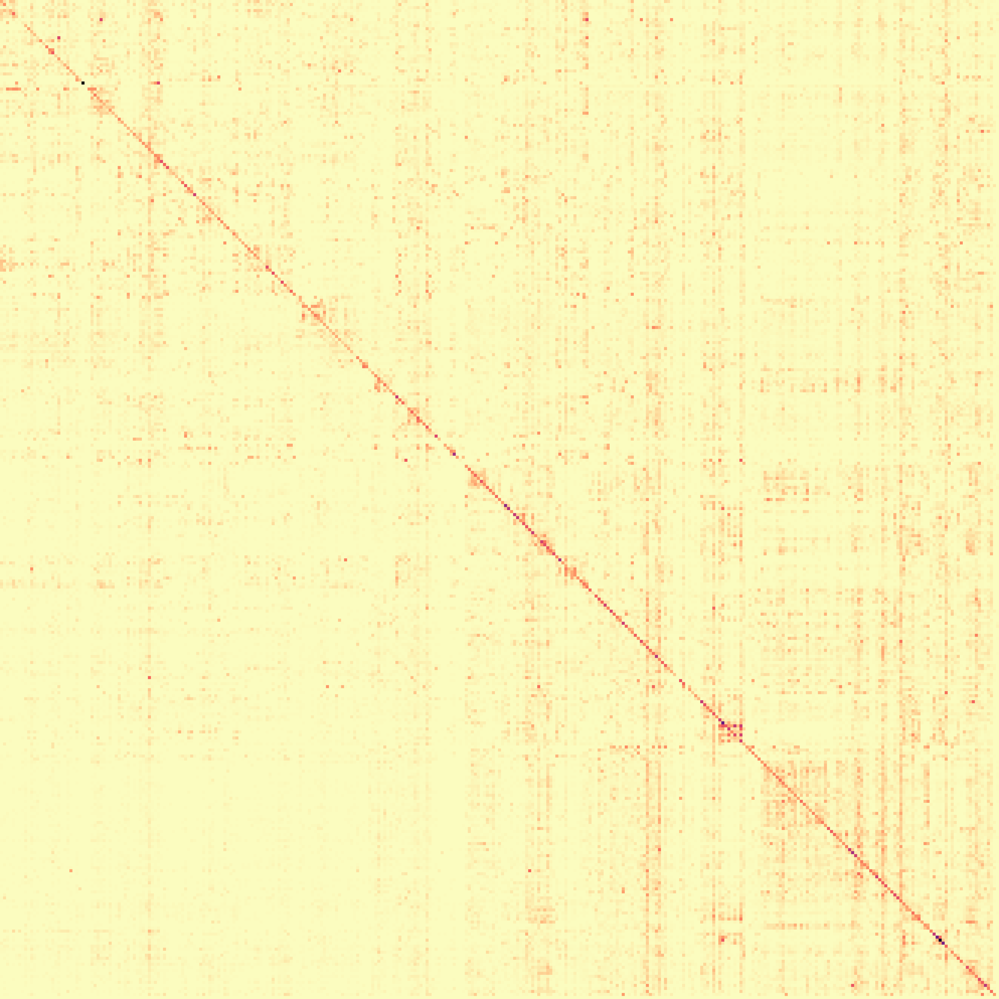

In [ ]:
# One-model/all-folds confusion matrix
for _params in [params, params_l1]:
    print(_params)
    with figsize(
        # 'square',
        # 'full',
        'full_dense',
    ):
        repr(cv_models
            [lambda df: df.params == _params]
            .pipe(lambda df: plot_confusion_matrix(
                classes=df.iloc[0].test_evals.classes,
                M=np.array([
                    row.test_evals.confusion_matrix_prob()
                    for row in df_rows(df)
                ]).sum(axis=0),
                # normalize=False,  # For counts
                raw=True, scale=10,  # Faster dev
                format=None,  # Omit numbers, too dense
                title=f'({recs_stats})',
            ))
        )

In [ ]:
BORING_ONE_MODEL_ONE_FOLD_PLOTS_NEXT

# Model diagnostics: one model, one fold

In [ ]:
fold = 0
# params_i = ...  # Comment out to reuse from above
params = cv_models.params.cat.categories[params_i]
[(_, model)] = list(cv_models[lambda df: (df.params == params) & (df.fold == fold)].iterrows())
print("params:\n%s" % '\n'.join('  %s: %r' % (i, x) for i, x in enumerate(cv_models.params.cat.categories)))
print()
print('model:')
print('  params[%s/%s]: %r' % (params_i, len(cv_models.params.cat.categories), model.params))
print('  fold[%s/%s]' % (model.fold, cv.cv.n_splits))
print()
print(model)

[skip]

In [ ]:
# in: model
model_id = model.model_id
params = model.params
fold = model.fold
# train_evals = model.train_evals
test_evals = model.test_evals

# in: model, recs
# train_recs = recs.iloc[train_evals.i]
# train_X = Search.X(recs)[train_evals.i]
# train_y = Search.y(recs)[train_evals.i]
test_recs = recs.iloc[test_evals.i]
test_X = Search.X(recs)[test_evals.i]
test_y = Search.y(recs)[test_evals.i]  # (Don't need to store cv_models.test_evals.y if we have recs -- which sometimes we don't?)

display(
    # len(train_recs),
    len(test_recs),
)

[skip]

In [ ]:
# TODO Restore this plot like 'Coverage error over ...' above, so we can see _one_ model instead of aggregating over n_splits models
# # TODO Update [kill the .merge, then species -> y_true]
# (search.coverage_error_by(test_recs, 'id')
#     [:5]
#     # .merge(test_recs[['id', 'species']], on='id', how='left')
#     # .pipe(ggplot, aes(x='species', y='coverage_error'))
#     # + geom_count(aes(size='..n..'))
#     # + stat_summary(fun_y=np.mean, geom='point', color='red', alpha=.5, shape='|', size=6, stroke=1)
#     # + stat_summary(
#     #     fun_ymin=partial(np.percentile, q=25), fun_ymax=partial(np.percentile, q=75),
#     #     geom='linerange', color='red', alpha=.5, size=1,
#     # )
#     # + coord_flip()
#     # + geom_hline(yintercept=len(search.classes_), color='grey')
#     # + scale_x_discrete(limits=list(reversed(test_recs.species.cat.categories)))
#     # + theme_figsize('square')
#     # + ggtitle(rf'Coverage error over instance ({model_id}) ({recs_stats})')
# )

[skip]

In [ ]:
# One-model/one-fold confusion matrix
with figsize(
    'square',
    # 'full',
    # 'full_dense',
):
    plot_confusion_matrix_df(
        confusion_matrix_prob_df(model.test_evals.y, model.test_evals.y_scores, model.test_evals.classes),
        title=model.model_id,
        # normalize=False,  # For counts
        raw=True, scale=10,  # Faster dev
        title=f'({recs_stats})',
    )

[skip]

In [ ]:
DEBUG_PLOTS_NEXT

# Debug plots, ignored by default

## Debug: resource usage

In [ ]:
(cv_models
    .pipe(df_reverse_cat, 'params', 'params_no_ns', 'ns')
    # Manually compute y.mean() per group
    .groupby('params').apply(lambda g: g.assign(mem_rss_delta_mean=lambda df: df.mem_rss_delta.mean()))
    .pipe(ggplot, aes(x='ns', group='params_no_ns'))
    + geom_col(aes(y='mem_rss_delta_mean', fill='params_no_ns'), position=position_dodge()) # Summary per fold
    + geom_point(aes(y='mem_rss_delta'), fill='none', size=2, position=position_dodge(width=.9)) # Distribution of folds
    + coord_flip()
    + scale_fill_cmap_d(mpl_cmap_concat('tab20', 'tab20b', 'tab20c'))
    + scale_y_continuous(labels=labels_bytes(), breaks=breaks_bytes())
    + guides(fill=guide_legend(reverse=True))
    + theme(legend_position='bottom', legend_direction='vertical', legend_box_spacing=.4, legend_key_height=8)
    + theme_figsize(aspect_ratio=1/3*2)
    + ggtitle(f'Mem rss spread ($max-min$) ({recs_stats})')
)

[skip]

In [ ]:
# TODO Very slow with ~200 models
cv_models_proc_stats = (cv_models
    # Enable these as needed (at the cost of mem usage)
    [[
        'model_id',
        'params',
        # 'params_dict',
        'params_data',
        'params_complexity',
        'params_model',
        'fold',
        # 'train_score',
        # 'test_score',
        # 'fit_time',
        # 'score_time',
        'mem_rss_delta',
        # 'mem_vms_delta',
        # 'train_evals',
        # 'test_evals',
        'proc_stats',
    ]]
    # TODO Faster way to do this? (.merge is >2x slower)
    .pipe(df_flatmap, lambda row: [
        row.append(pd.Series(dict(**stats)))
        for stats in row.proc_stats.stats
    ])
    # .pipe(lambda df: (df
    #     .merge(how='left',
    #         right=DF(
    #             OrderedDict(model_id=row.model_id, **stats)
    #             for row in df_rows(df)
    #             for stats in row.proc_stats.stats
    #         )
    #     )
    # ))
    # HACK Restore the cats that the df_flatmap just destroyed [copied from cv_results_splits_df]
    .pipe(df_ordered_cat,
        model_id=lambda df: df.model_id.unique(),
        params=lambda df: df.params.unique(),
    )
    .assign(
        cpu_user=lambda df: df.cpu_user.diff() * 100,
        cpu_system=lambda df: df.cpu_system.diff() * 100,
    )
    .pipe(tap, f=lambda df: display(
        df_summary(df).T,
        df[:5],
    ))
)

[skip]

In [ ]:
# TODO Might need to stack/geom_area for overlapping runs
(cv_models_proc_stats
    .pipe(ggplot)
    + aes(x='time', color='model_id')
    + geom_line(aes(y='cpu_system'), linetype='dashed', size=.5)
    + geom_line(aes(y='cpu_system + cpu_user'), linetype='solid', size=.5)
    + expand_limits(y=0)
    + ylab('cpu')
    + scale_x_datetime(date_labels='%H:%M:%S')
    + scale_y_continuous(labels=lambda labels: ['%.3g%%' % x for x in labels])
    + theme(legend_position='bottom', legend_direction='vertical', legend_box_spacing=.4, legend_key_height=8)
    + theme_figsize('inline_short')
    + ggtitle('cpu over time (system + user)')
)

[skip]

In [ ]:
(cv_models_proc_stats
    .pipe(ggplot)
    + aes(x='time', color='model_id')
    + geom_line(aes(y='mem_rss'), linetype='solid', size=.5)
    + geom_line(aes(y='mem_vms'), linetype='dashed', size=.5)
    + expand_limits(y=0)
    + ylab('mem')
    + scale_x_datetime(date_labels='%H:%M:%S')
    + scale_y_continuous(labels=labels_bytes(), breaks=breaks_bytes(pow=3))
    + theme(legend_position='bottom', legend_direction='vertical', legend_box_spacing=.4, legend_key_height=8)
    + theme_figsize('inline_short')
    + ggtitle('Mem over time (rss, vms)')
)

[skip]

## Debug: RF tuning

In [ ]:
# TODO Revive if insightful
(cv_models
    .pipe(df_reverse_cat, 'params_no_ns')
    .assign(n_species=lambda df: df.params_dict.str['n_species'])
    .pipe(ggplot, aes(x='n_species', y='forest_depth_mean', color='params_no_ns'))
    # + facet_wrap('params_no_ns', ncol=2)
    + geom_point()
    + geom_pointrange(aes(ymin='forest_depth_mean - 2*forest_depth_std', ymax='forest_depth_mean + 2*forest_depth_std'))
    + geom_smooth(method='lm', se=False)  # Disable se because it only knows forest_depth_mean, no measure of spread
    + expand_limits(x=0)
    + scale_color_cmap_d(mpl_cmap_concat('tab20', 'tab20b', 'tab20c'))
    + guides(color=guide_legend(reverse=True))
    + theme(legend_position='bottom', legend_direction='vertical', legend_box_spacing=.4, legend_key_height=8)
    # + theme_figsize(aspect_ratio=1/3)
    + theme_figsize(aspect_ratio=1/3)
    + ggtitle(f'RF depth vs. n_species ({recs_stats})')
)

[skip]